**Скачаем датасет Oxford Pets с каггла с картинками домашних животных**

In [1]:
api_token = {"username":"qwersdtfbh","key":"f8fc96eed423727aa416cef08d4f3ad8"}

import sys
import json

!{sys.executable} -m pip install kaggle

!mkdir ~/.kaggle
with open('kaggle.json', 'w') as file:
    json.dump(api_token, file)
!mv kaggle.json ~/.kaggle
!chmod 600 ~/.kaggle/kaggle.json

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [2]:
!kaggle datasets download -d tanlikesmath/the-oxfordiiit-pet-dataset

100% 1.47G/1.48G [00:23<00:00, 48.4MB/s]
100% 1.48G/1.48G [00:23<00:00, 68.0MB/s]


In [3]:
!unzip the-oxfordiiit-pet-dataset.zip
!rm the-oxfordiiit-pet-dataset.zip


Выходные данные были обрезаны до нескольких последних строк (5000).
  inflating: images/images/leonberger_81.jpg  
  inflating: images/images/leonberger_82.jpg  
  inflating: images/images/leonberger_83.jpg  
  inflating: images/images/leonberger_84.jpg  
  inflating: images/images/leonberger_85.jpg  
  inflating: images/images/leonberger_86.jpg  
  inflating: images/images/leonberger_87.jpg  
  inflating: images/images/leonberger_88.jpg  
  inflating: images/images/leonberger_89.jpg  
  inflating: images/images/leonberger_9.jpg  
  inflating: images/images/leonberger_90.jpg  
  inflating: images/images/leonberger_91.jpg  
  inflating: images/images/leonberger_92.jpg  
  inflating: images/images/leonberger_93.jpg  
  inflating: images/images/leonberger_94.jpg  
  inflating: images/images/leonberger_95.jpg  
  inflating: images/images/leonberger_96.jpg  
  inflating: images/images/leonberger_97.jpg  
  inflating: images/images/leonberger_98.jpg  
  inflating: images/images/leonberger_99

In [4]:
import os
print(os.listdir("images/"))

['Bengal_150.jpg', 'Egyptian_Mau_13.jpg', 'Russian_Blue_187.jpg', 'english_setter_173.jpg', 'Persian_161.jpg', 'miniature_pinscher_68.jpg', 'Egyptian_Mau_161.jpg', 'newfoundland_93.jpg', 'pug_102.jpg', 'basset_hound_2.jpg', 'Ragdoll_1.jpg', 'english_setter_129.jpg', 'saint_bernard_34.jpg', 'Abyssinian_127.jpg', 'miniature_pinscher_117.jpg', 'boxer_78.jpg', 'japanese_chin_126.jpg', 'japanese_chin_40.jpg', 'english_cocker_spaniel_164.jpg', 'american_bulldog_216.jpg', 'Bombay_29.jpg', 'Siamese_17.jpg', 'boxer_5.jpg', 'japanese_chin_91.jpg', 'Bengal_195.jpg', 'Russian_Blue_129.jpg', 'keeshond_107.jpg', 'beagle_181.jpg', 'keeshond_135.jpg', 'Persian_144.jpg', 'pug_33.jpg', 'staffordshire_bull_terrier_6.jpg', 'great_pyrenees_99.jpg', 'japanese_chin_118.jpg', 'Russian_Blue_61.jpg', 'Ragdoll_183.jpg', 'Persian_97.jpg', 'boxer_187.jpg', 'pomeranian_144.jpg', 'keeshond_148.jpg', 'american_pit_bull_terrier_189.jpg', 'miniature_pinscher_147.jpg', 'wheaten_terrier_127.jpg', 'pomeranian_117.jpg', 'l

**Импортируем библиотеки**

In [5]:
from __future__ import print_function
import time
import torch
import torch.nn as nn
import torch.nn.parallel
import torch.optim as optim
import torch.utils.data
import torchvision.datasets as dset
import torchvision.transforms as transforms
import torchvision.utils as vutils
from torch.autograd import Variable
import matplotlib.pyplot as plt
import numpy as np
from torch import nn, optim
import torch.nn.functional as F
from torchvision import datasets, transforms
from torchvision.utils import save_image
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from tqdm import tqdm_notebook as tqdm
import pathlib

## Некоторые картинки

There are 7394 all pictures.


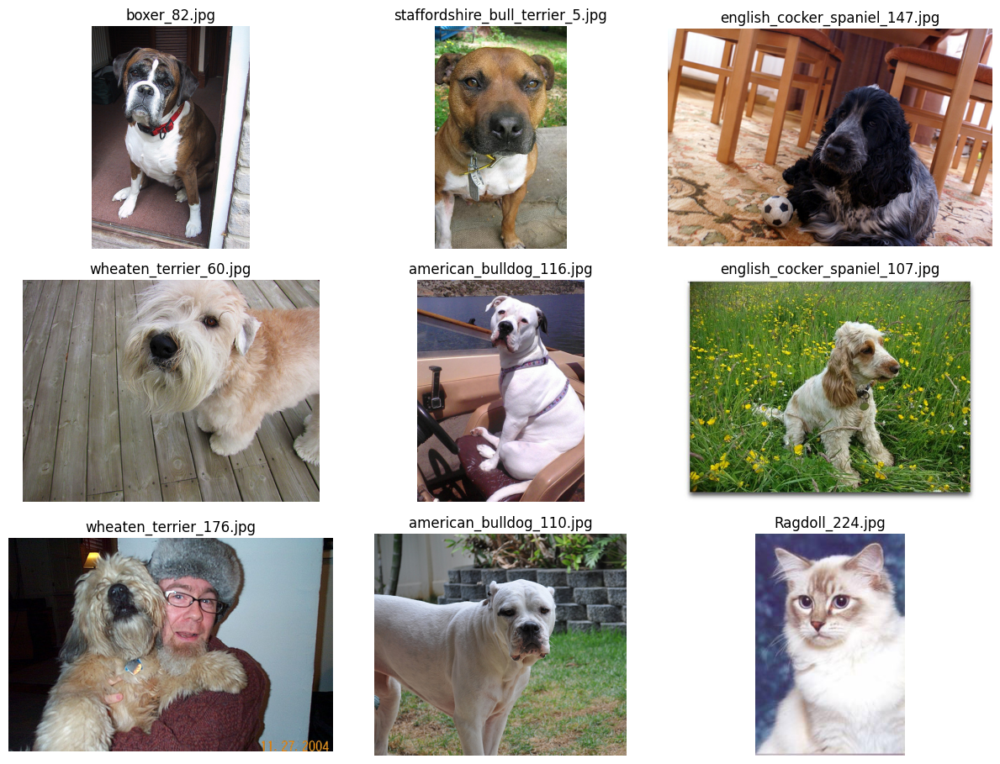

In [6]:
PATH = 'images/'
images = os.listdir(PATH)
print(f'There are {len(os.listdir(PATH))} all pictures.')

fig, axes = plt.subplots(nrows=3, ncols=3, figsize=(12,10))

for indx, axis in enumerate(axes.flatten()):
    rnd_indx = np.random.randint(0, len(os.listdir(PATH)))
    img = plt.imread(PATH + images[rnd_indx])
    imgplot = axis.imshow(img)
    axis.set_title(images[rnd_indx])
    axis.set_axis_off()
plt.tight_layout(rect=[0, 0.03, 1, 0.95])

## Предварительная обработка изображений


In [7]:
batch_size = 32
image_size = 64

random_transforms = [transforms.ColorJitter(), transforms.RandomRotation(degrees=20)]
transform = transforms.Compose([transforms.Resize(64),
                                transforms.CenterCrop(64),
                                transforms.RandomHorizontalFlip(p=0.5),
                                transforms.RandomApply(random_transforms, p=0.2),
                                transforms.ToTensor(),
                                transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))])

data_dir = pathlib.Path('images')

train_data = datasets.ImageFolder('images', transform=transform)
train_loader = torch.utils.data.DataLoader(train_data, shuffle=True,
                                           batch_size=batch_size)


imgs, label = next(iter(train_loader))
imgs = imgs.numpy().transpose(0, 2, 3, 1)

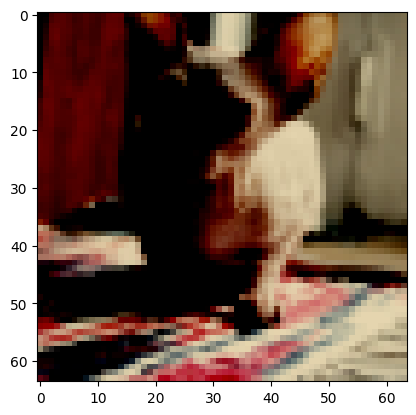

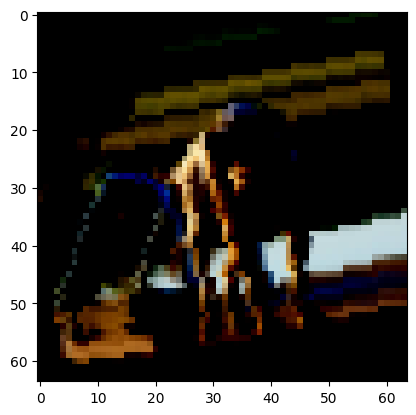

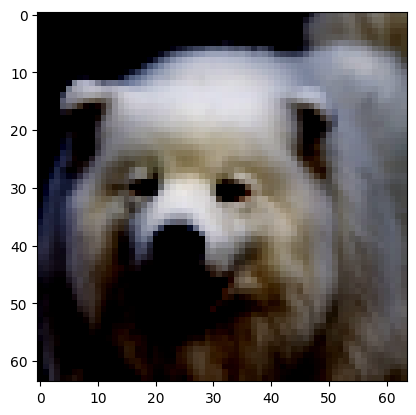

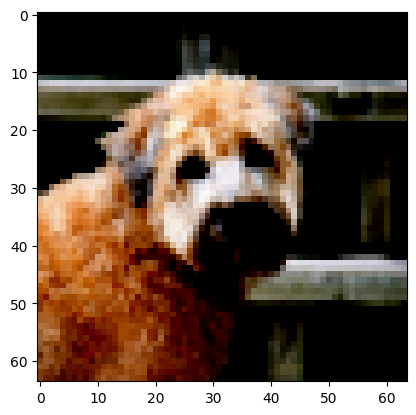

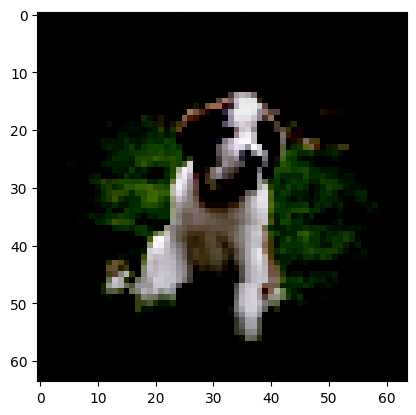

In [8]:
for i in range(5):
    plt.imshow(imgs[i])
    plt.show()

## Weights
### Определим функцию инициализации весов

In [9]:
def weights_init(m):
    """
    Takes as input a neural network m that will initialize all its weights.
    """
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        m.weight.data.normal_(0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        m.weight.data.normal_(1.0, 0.02)
        m.bias.data.fill_(0)

# Generator

In [10]:
class G(nn.Module):
    def __init__(self):
        super(G, self).__init__()
        self.main = nn.Sequential(
                nn.ConvTranspose2d(100, 512, 4, stride=1, padding=0, bias=False),
                nn.BatchNorm2d(512),
                nn.ReLU(True),
                nn.ConvTranspose2d(512, 256, 4, stride=2, padding=1, bias=False),
                nn.BatchNorm2d(256),
                nn.ReLU(True),
                nn.ConvTranspose2d(256, 128, 4, stride=2, padding=1, bias=False),
                nn.BatchNorm2d(128),
                nn.ReLU(True),
                nn.ConvTranspose2d(128, 64, 4, stride=2, padding=1, bias=False),
                nn.BatchNorm2d(64),
                nn.ReLU(True),
                nn.ConvTranspose2d(64, 3, 4, stride=2, padding=1, bias=False),
                nn.Tanh()
                )
        
    def forward(self, input):
        output = self.main(input)
        return output

# Creating the generator
netG = G()
netG.apply(weights_init)

G(
  (main): Sequential(
    (0): ConvTranspose2d(100, 512, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (4): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (7): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): ReLU(inplace=True)
    (9): ConvTranspose2d(128, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (10): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (11): ReLU(inplace=True)
    (12): ConvTranspose2d(64, 3, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (13): Tanh()
  )
)

# Discriminator

In [11]:
# Defining the discriminator
class D(nn.Module):
    def __init__(self):
        super(D, self).__init__()
        self.main = nn.Sequential(
                nn.Conv2d(3, 64, 4, stride=2, padding=1, bias=False),
                nn.LeakyReLU(negative_slope=0.2, inplace=True),
                nn.Conv2d(64, 128, 4, stride=2, padding=1, bias=False),
                nn.BatchNorm2d(128),
                nn.LeakyReLU(negative_slope=0.2, inplace=True),
                nn.Conv2d(128, 256, 4, stride=2, padding=1, bias=False),
                nn.BatchNorm2d(256),
                nn.LeakyReLU(negative_slope=0.2, inplace=True),
                nn.Conv2d(256, 512, 4, stride=2, padding=1, bias=False),
                nn.BatchNorm2d(512),
                nn.LeakyReLU(negative_slope=0.2, inplace=True),
                nn.Conv2d(512, 1, 4, stride=1, padding=0, bias=False),
                nn.Sigmoid()
                )
        
    def forward(self, input):
        output = self.main(input)
        return output.view(-1)
    
    
# Creating the discriminator
netD = D()
netD.apply(weights_init)


D(
  (main): Sequential(
    (0): Conv2d(3, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): LeakyReLU(negative_slope=0.2, inplace=True)
    (2): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (3): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (4): LeakyReLU(negative_slope=0.2, inplace=True)
    (5): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (6): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (7): LeakyReLU(negative_slope=0.2, inplace=True)
    (8): Conv2d(256, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (9): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (10): LeakyReLU(negative_slope=0.2, inplace=True)
    (11): Conv2d(512, 1, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (12): Sigmoid()
  )
)

## Допонительная установка

In [12]:
class Generator(nn.Module):
    def __init__(self, nz=128, channels=3):
        super(Generator, self).__init__()
        
        self.nz = nz
        self.channels = channels
        
        def convlayer(n_input, n_output, k_size=4, stride=2, padding=0):
            block = [
                nn.ConvTranspose2d(n_input, n_output, kernel_size=k_size, stride=stride, padding=padding, bias=False),
                nn.BatchNorm2d(n_output),
                nn.ReLU(inplace=True),
            ]
            return block

        self.model = nn.Sequential(
            *convlayer(self.nz, 1024, 4, 1, 0),
            *convlayer(1024, 512, 4, 2, 1),
            *convlayer(512, 256, 4, 2, 1),
            *convlayer(256, 128, 4, 2, 1),
            *convlayer(128, 64, 4, 2, 1),
            nn.ConvTranspose2d(64, self.channels, 3, 1, 1),
            nn.Tanh()
        )

    def forward(self, z):
        z = z.view(-1, self.nz, 1, 1)
        img = self.model(z)
        return img

    
class Discriminator(nn.Module):
    def __init__(self, channels=3):
        super(Discriminator, self).__init__()
        
        self.channels = channels

        def convlayer(n_input, n_output, k_size=4, stride=2, padding=0, bn=False):
            block = [nn.Conv2d(n_input, n_output, kernel_size=k_size, stride=stride, padding=padding, bias=False)]
            if bn:
                block.append(nn.BatchNorm2d(n_output))
            block.append(nn.LeakyReLU(0.2, inplace=True))
            return block

        self.model = nn.Sequential(
            *convlayer(self.channels, 32, 4, 2, 1),
            *convlayer(32, 64, 4, 2, 1),
            *convlayer(64, 128, 4, 2, 1, bn=True),
            *convlayer(128, 256, 4, 2, 1, bn=True),
            nn.Conv2d(256, 1, 4, 1, 0, bias=False), 
        )

    def forward(self, imgs):
        logits = self.model(imgs)
        out = torch.sigmoid(logits)
    
        return out.view(-1, 1)

# Обучение

In [14]:
EPOCH = 1
LR = 0.001
criterion = nn.BCELoss()
optimizerD = optim.Adam(netD.parameters(), lr=LR, betas=(0.5, 0.999))
optimizerG = optim.Adam(netG.parameters(), lr=LR, betas=(0.5, 0.999))

This doesn't run because EPOCH = 0, change it and try ;)

In [15]:
for epoch in range(EPOCH):
    for i, data in enumerate(train_loader, 0):
        # 1st Step: Updating the weights of the neural network of the discriminator
        netD.zero_grad()
        
        # Training the discriminator with a real image of the dataset
        real,_ = data
        input = Variable(real)
        target = Variable(torch.ones(input.size()[0]))
        output = netD(input)
        errD_real = criterion(output, target)
        
        # Training the discriminator with a fake image generated by the generator
        noise = Variable(torch.randn(input.size()[0], 100, 1, 1))
        fake = netG(noise)
        target = Variable(torch.zeros(input.size()[0]))
        output = netD(fake.detach())
        errD_fake = criterion(output, target)
        
        # Backpropagating the total error
        errD = errD_real + errD_fake
        errD.backward()
        optimizerD.step()
        
        # 2nd Step: Updating the weights of the neural network of the generator
        netG.zero_grad()
        target = Variable(torch.ones(input.size()[0]))
        output = netD(fake)
        errG = criterion(output, target)
        errG.backward()
        optimizerG.step()
        
        # 3rd Step: Printing the losses and saving the real images and the generated images of the minibatch every 100 steps
        print('[%d/%d][%d/%d] Loss_D: %.4f; Loss_G: %.4f' % (epoch, EPOCH, i, len(train_loader), errD.item(), errG.item()))
        if i % 100 == 0:
            vutils.save_image(real, '%s/real_samples.png' % "./results", normalize=True)
            fake = netG(noise)
            vutils.save_image(fake.data, '%s/fake_samples_epoch_%03d.png' % ("./results", epoch), normalize=True)

[0/1][0/231] Loss_D: 1.7417; Loss_G: 31.3411
[0/1][1/231] Loss_D: 2.6820; Loss_G: 6.4694
[0/1][2/231] Loss_D: 100.2184; Loss_G: 0.0000
[0/1][3/231] Loss_D: 100.0008; Loss_G: 0.0000
[0/1][4/231] Loss_D: 100.0001; Loss_G: 0.0000
[0/1][5/231] Loss_D: 100.0000; Loss_G: 0.0000
[0/1][6/231] Loss_D: 100.0000; Loss_G: 0.0000
[0/1][7/231] Loss_D: 100.0000; Loss_G: 0.0000
[0/1][8/231] Loss_D: 100.0000; Loss_G: 0.0000
[0/1][9/231] Loss_D: 100.0000; Loss_G: 0.0000
[0/1][10/231] Loss_D: 100.0000; Loss_G: 0.0000
[0/1][11/231] Loss_D: 100.0002; Loss_G: 0.0000
[0/1][12/231] Loss_D: 100.0000; Loss_G: 0.0000
[0/1][13/231] Loss_D: 100.0000; Loss_G: 0.0000
[0/1][14/231] Loss_D: 100.0000; Loss_G: 0.0000
[0/1][15/231] Loss_D: 100.0000; Loss_G: 0.0000
[0/1][16/231] Loss_D: 100.0000; Loss_G: 0.0000
[0/1][17/231] Loss_D: 100.0001; Loss_G: 0.0000
[0/1][18/231] Loss_D: 100.0000; Loss_G: 0.0000
[0/1][19/231] Loss_D: 100.0000; Loss_G: 0.0000
[0/1][20/231] Loss_D: 100.0000; Loss_G: 0.0000
[0/1][21/231] Loss_D: 100.

### Параметры обучения

In [16]:
batch_size = 32
LR_G = 0.001
LR_D = 0.0005

beta1 = 0.5
epochs = 50

real_label = 0.9
fake_label = 0
nz = 128

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

### Инициализируем модель и оптимизаторы

In [17]:
netG = Generator(nz).to(device)
netD = Discriminator().to(device)

criterion = nn.BCELoss()

optimizerD = optim.Adam(netD.parameters(), lr=LR_D, betas=(beta1, 0.999))
optimizerG = optim.Adam(netG.parameters(), lr=LR_G, betas=(beta1, 0.999))

fixed_noise = torch.randn(25, nz, 1, 1, device=device)

G_losses = []
D_losses = []
epoch_time = []

**Метод построения графика потерь за эпоху**

In [18]:
def plot_loss (G_losses, D_losses, epoch):
    plt.figure(figsize=(10,5))
    plt.title("Generator and Discriminator Loss - EPOCH "+ str(epoch))
    plt.plot(G_losses,label="G")
    plt.plot(D_losses,label="D")
    plt.xlabel("iterations")
    plt.ylabel("Loss")
    plt.legend()
    plt.show()

**Метод для показа сгенерированных изображений**

In [19]:
def show_generated_img(n_images=5):
    sample = []
    for _ in range(n_images):
        noise = torch.randn(1, nz, 1, 1, device=device)
        gen_image = netG(noise).to("cpu").clone().detach().squeeze(0)
        gen_image = gen_image.numpy().transpose(1, 2, 0)
        sample.append(gen_image)
    
    figure, axes = plt.subplots(1, len(sample), figsize = (64,64))
    for index, axis in enumerate(axes):
        axis.axis('off')
        image_array = sample[index]
        axis.imshow(image_array)
        
    plt.show()
    plt.close()

### Тренировочный цикл

<ipython-input-20-a6affce909ef>:4: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  for ii, (real_images, train_labels) in tqdm(enumerate(train_loader), total=len(train_loader)):


  0%|          | 0/231 [00:00<?, ?it/s]

[1/50][115/231] Loss_D: 1.1042 Loss_G: 1.3230 D(x): 0.5312 D(G(z)): 0.3080 / 0.2744
[1/50][230/231] Loss_D: 1.2656 Loss_G: 1.4879 D(x): 0.4801 D(G(z)): 0.3382 / 0.2100


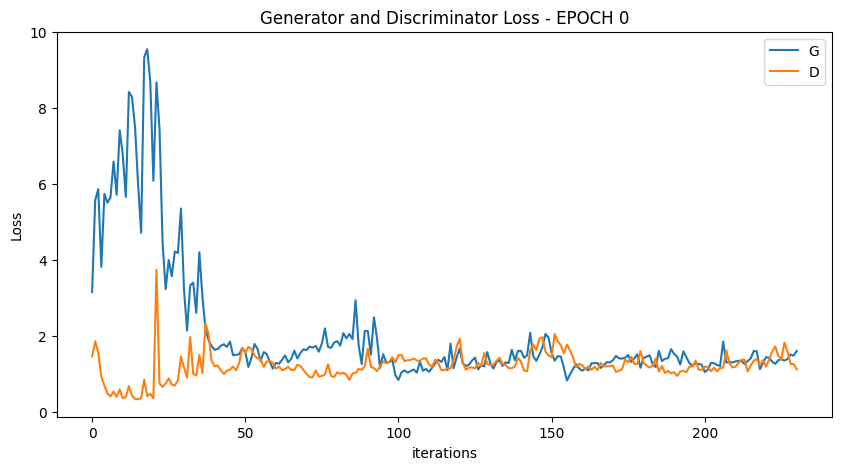

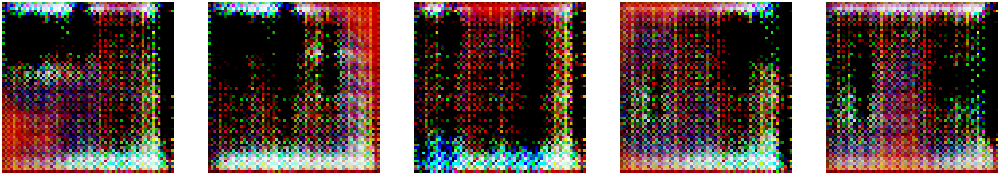

  0%|          | 0/231 [00:00<?, ?it/s]

[2/50][115/231] Loss_D: 1.4240 Loss_G: 1.2731 D(x): 0.5086 D(G(z)): 0.4500 / 0.2904
[2/50][230/231] Loss_D: 1.1572 Loss_G: 1.2826 D(x): 0.4223 D(G(z)): 0.2366 / 0.2541


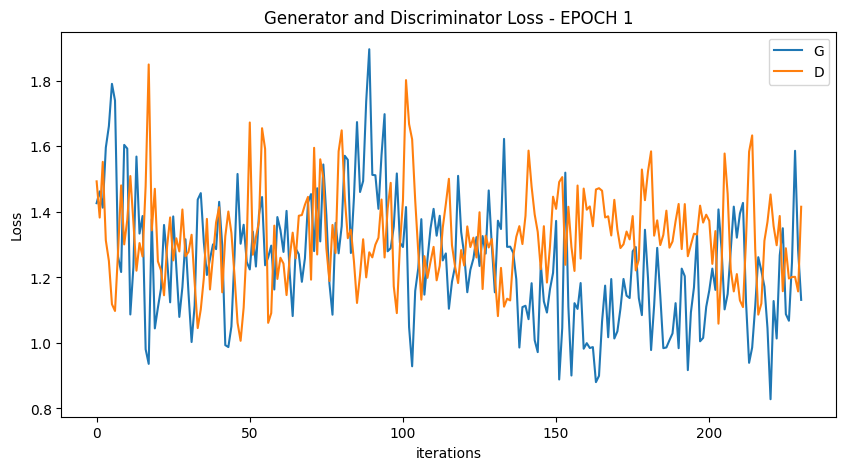

  0%|          | 0/231 [00:00<?, ?it/s]

[3/50][115/231] Loss_D: 1.2231 Loss_G: 1.2534 D(x): 0.4845 D(G(z)): 0.3609 / 0.2768
[3/50][230/231] Loss_D: 1.3166 Loss_G: 1.1981 D(x): 0.5590 D(G(z)): 0.4677 / 0.2920


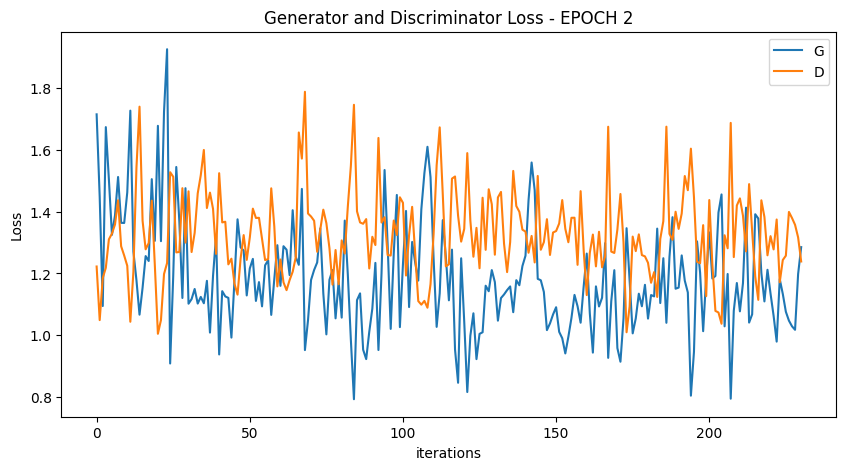

  0%|          | 0/231 [00:00<?, ?it/s]

[4/50][115/231] Loss_D: 1.4138 Loss_G: 0.9244 D(x): 0.4453 D(G(z)): 0.4237 / 0.3936
[4/50][230/231] Loss_D: 1.4446 Loss_G: 1.2698 D(x): 0.3646 D(G(z)): 0.2972 / 0.2885


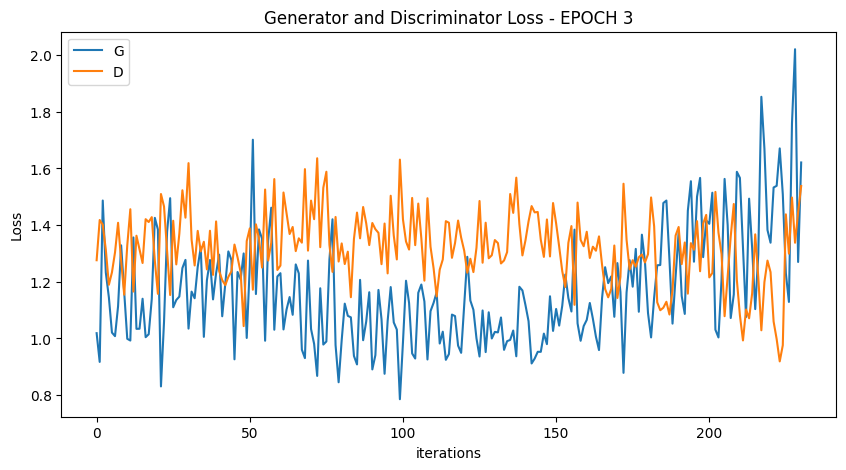

  0%|          | 0/231 [00:00<?, ?it/s]

[5/50][115/231] Loss_D: 0.9843 Loss_G: 1.9597 D(x): 0.6224 D(G(z)): 0.3251 / 0.1273
[5/50][230/231] Loss_D: 1.7550 Loss_G: 1.1119 D(x): 0.3557 D(G(z)): 0.4720 / 0.3184


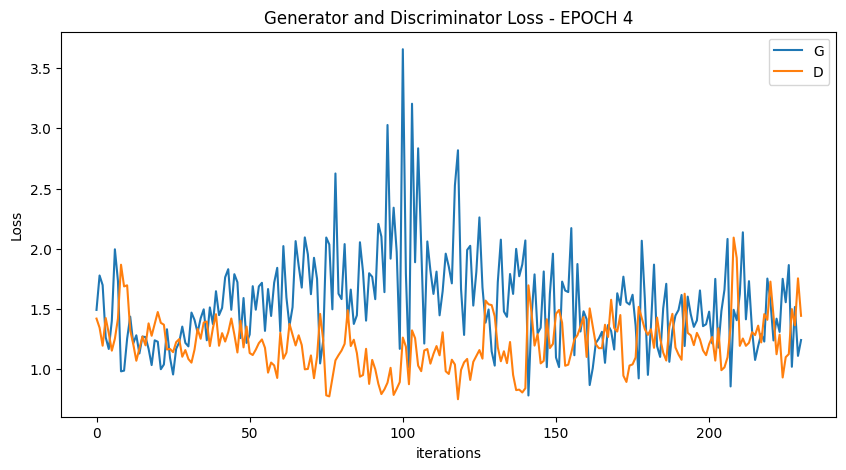

  0%|          | 0/231 [00:00<?, ?it/s]

[6/50][115/231] Loss_D: 1.3486 Loss_G: 1.1152 D(x): 0.3932 D(G(z)): 0.3222 / 0.3171
[6/50][230/231] Loss_D: 1.3251 Loss_G: 1.1719 D(x): 0.4978 D(G(z)): 0.4050 / 0.2995


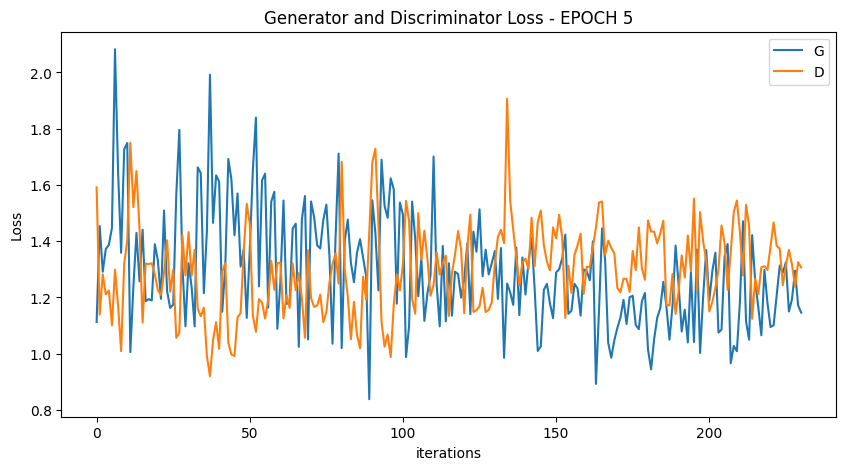

  0%|          | 0/231 [00:00<?, ?it/s]

[7/50][115/231] Loss_D: 1.6772 Loss_G: 0.8614 D(x): 0.2672 D(G(z)): 0.3002 / 0.4215
[7/50][230/231] Loss_D: 1.3063 Loss_G: 0.9737 D(x): 0.4600 D(G(z)): 0.3783 / 0.3725


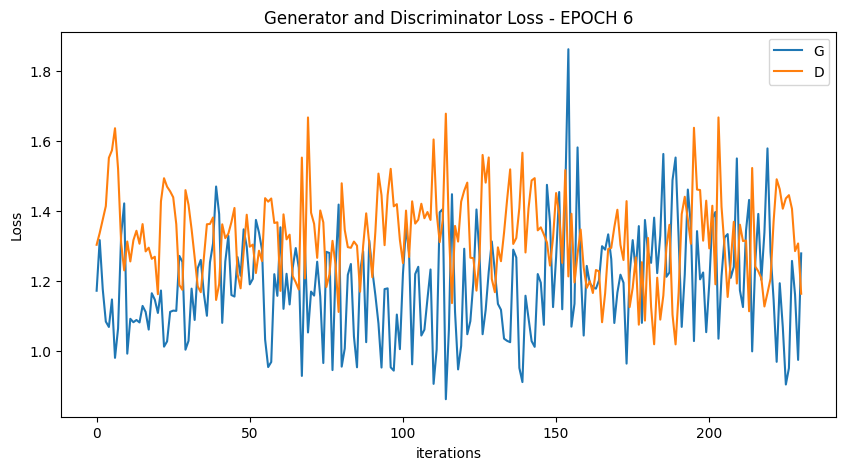

  0%|          | 0/231 [00:00<?, ?it/s]

[8/50][115/231] Loss_D: 1.2538 Loss_G: 1.3682 D(x): 0.5412 D(G(z)): 0.3962 / 0.2645
[8/50][230/231] Loss_D: 1.2824 Loss_G: 1.1281 D(x): 0.5502 D(G(z)): 0.4302 / 0.3159


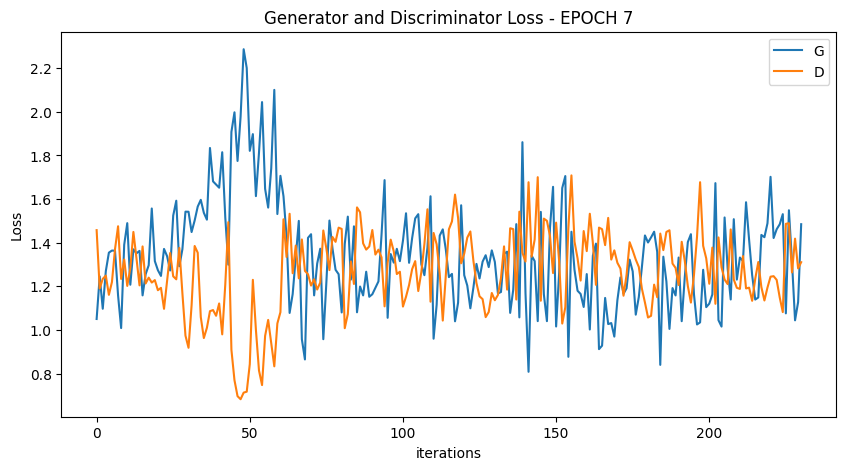

  0%|          | 0/231 [00:00<?, ?it/s]

[9/50][115/231] Loss_D: 1.4505 Loss_G: 1.0164 D(x): 0.4639 D(G(z)): 0.4522 / 0.3546
[9/50][230/231] Loss_D: 1.4399 Loss_G: 1.1048 D(x): 0.3772 D(G(z)): 0.3565 / 0.3187


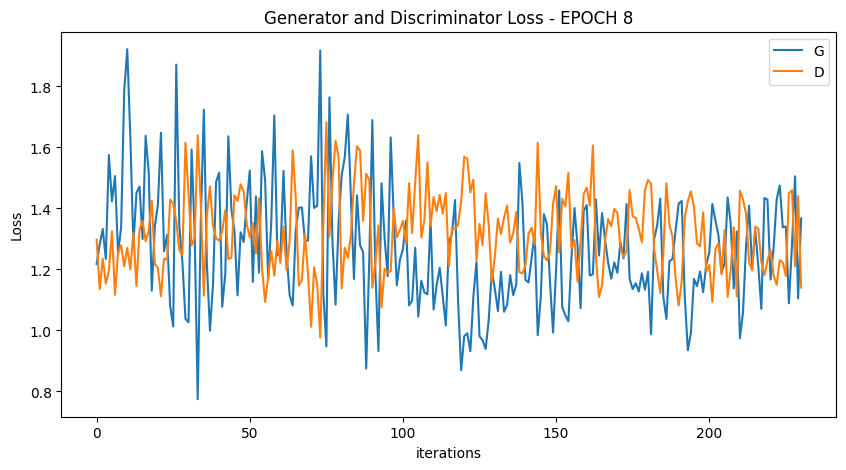

  0%|          | 0/231 [00:00<?, ?it/s]

[10/50][115/231] Loss_D: 1.1240 Loss_G: 1.4255 D(x): 0.5420 D(G(z)): 0.3446 / 0.2342
[10/50][230/231] Loss_D: 1.3050 Loss_G: 1.1384 D(x): 0.4152 D(G(z)): 0.3412 / 0.3128


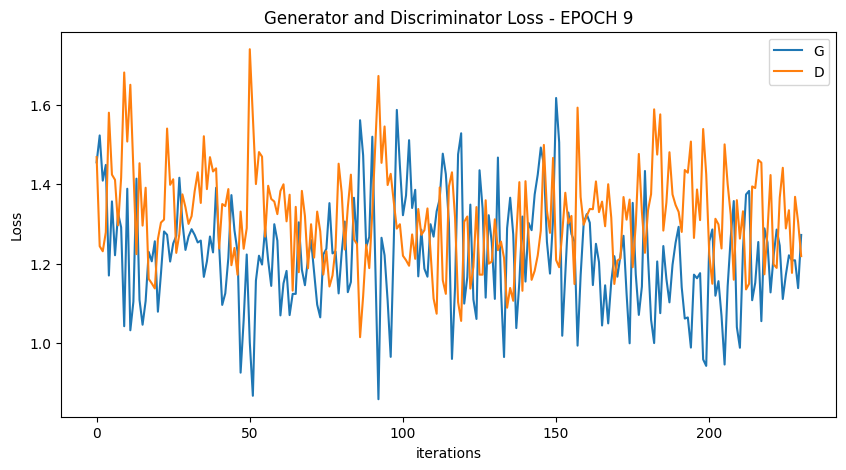

  0%|          | 0/231 [00:00<?, ?it/s]

[11/50][115/231] Loss_D: 1.3773 Loss_G: 1.0541 D(x): 0.5096 D(G(z)): 0.4689 / 0.3480
[11/50][230/231] Loss_D: 1.4675 Loss_G: 1.2537 D(x): 0.3702 D(G(z)): 0.3697 / 0.2977


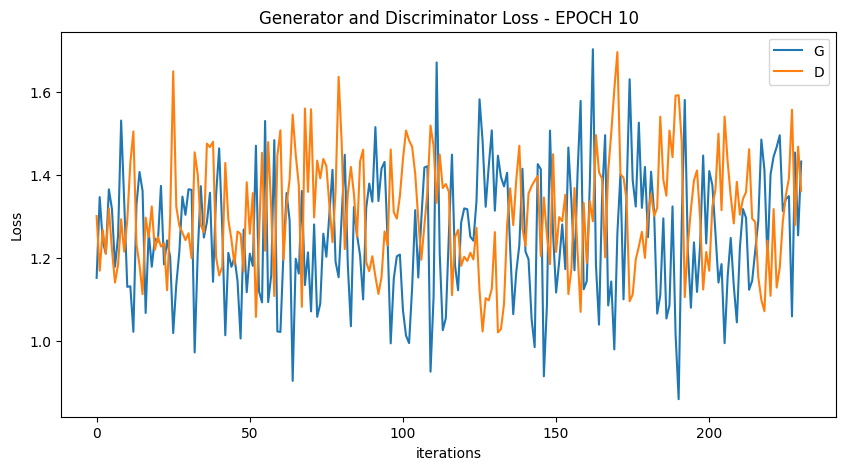

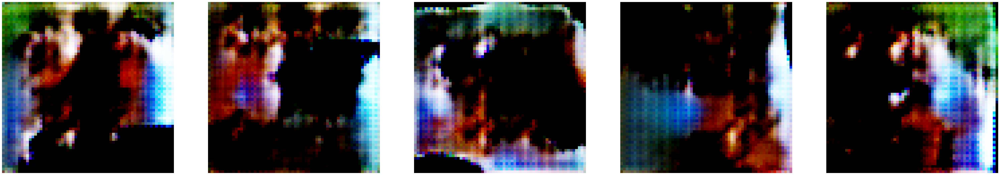

  0%|          | 0/231 [00:00<?, ?it/s]

[12/50][115/231] Loss_D: 1.4130 Loss_G: 1.2359 D(x): 0.5114 D(G(z)): 0.4723 / 0.2964
[12/50][230/231] Loss_D: 1.2899 Loss_G: 1.1394 D(x): 0.4628 D(G(z)): 0.3751 / 0.3105


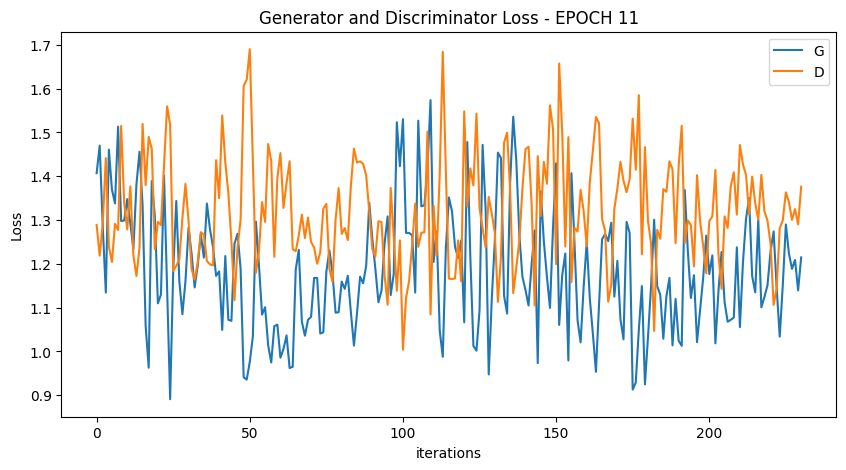

  0%|          | 0/231 [00:00<?, ?it/s]

[13/50][115/231] Loss_D: 1.3890 Loss_G: 1.2392 D(x): 0.3467 D(G(z)): 0.2619 / 0.2840
[13/50][230/231] Loss_D: 1.1845 Loss_G: 1.4173 D(x): 0.5848 D(G(z)): 0.4198 / 0.2299


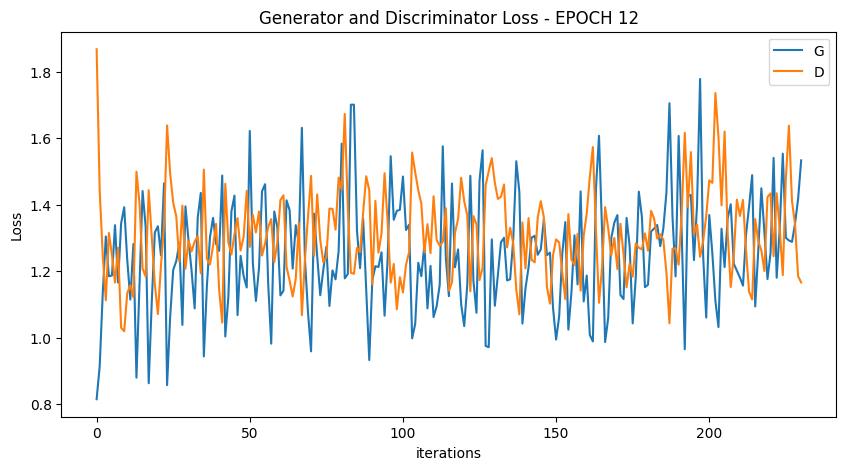

  0%|          | 0/231 [00:00<?, ?it/s]

[14/50][115/231] Loss_D: 1.3456 Loss_G: 1.1257 D(x): 0.4227 D(G(z)): 0.3619 / 0.3086
[14/50][230/231] Loss_D: 1.3274 Loss_G: 0.9793 D(x): 0.4678 D(G(z)): 0.3893 / 0.3769


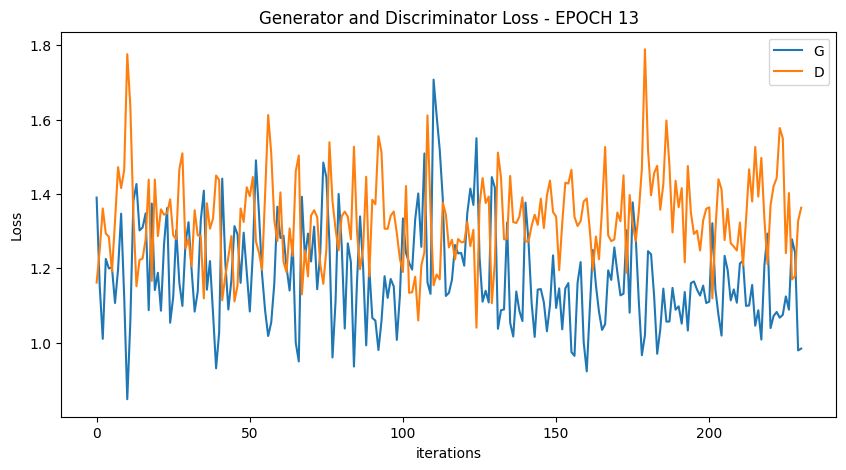

  0%|          | 0/231 [00:00<?, ?it/s]

[15/50][115/231] Loss_D: 1.2867 Loss_G: 1.1310 D(x): 0.4637 D(G(z)): 0.3837 / 0.3111
[15/50][230/231] Loss_D: 1.4091 Loss_G: 1.1590 D(x): 0.4477 D(G(z)): 0.3900 / 0.3118


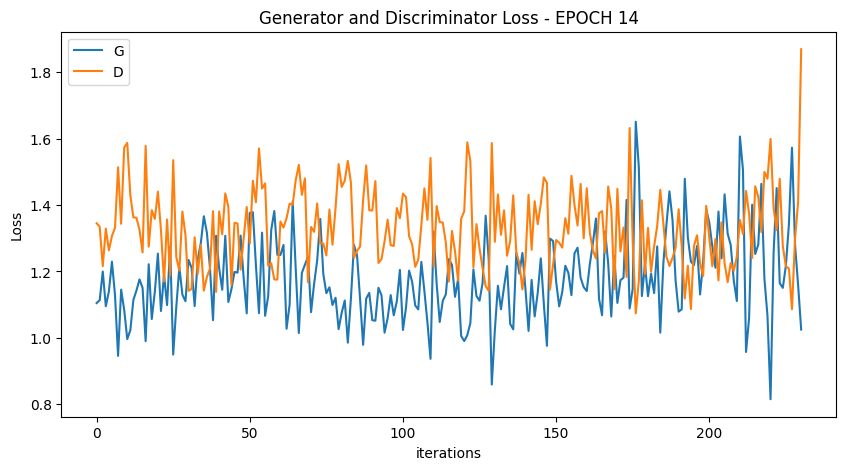

  0%|          | 0/231 [00:00<?, ?it/s]

[16/50][115/231] Loss_D: 1.3395 Loss_G: 1.1145 D(x): 0.5778 D(G(z)): 0.4897 / 0.3157
[16/50][230/231] Loss_D: 1.1591 Loss_G: 1.2773 D(x): 0.5971 D(G(z)): 0.4274 / 0.2705


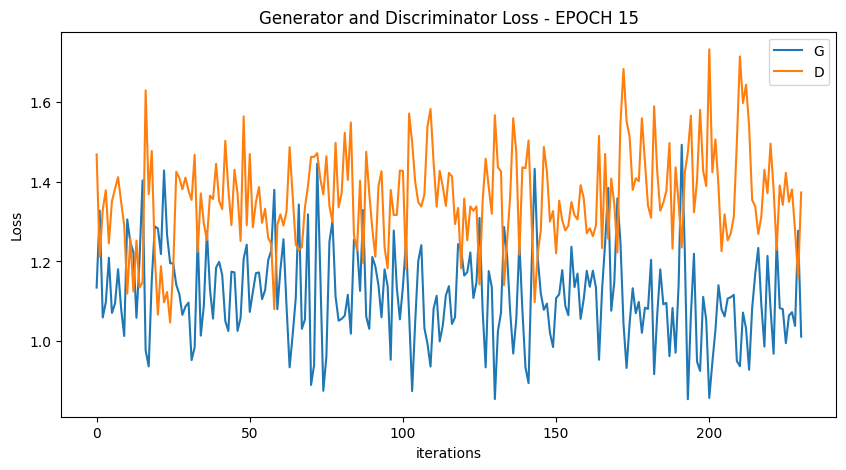

  0%|          | 0/231 [00:00<?, ?it/s]

[17/50][115/231] Loss_D: 1.4867 Loss_G: 1.0412 D(x): 0.5060 D(G(z)): 0.5239 / 0.3484
[17/50][230/231] Loss_D: 1.3875 Loss_G: 1.0797 D(x): 0.5044 D(G(z)): 0.4818 / 0.3331


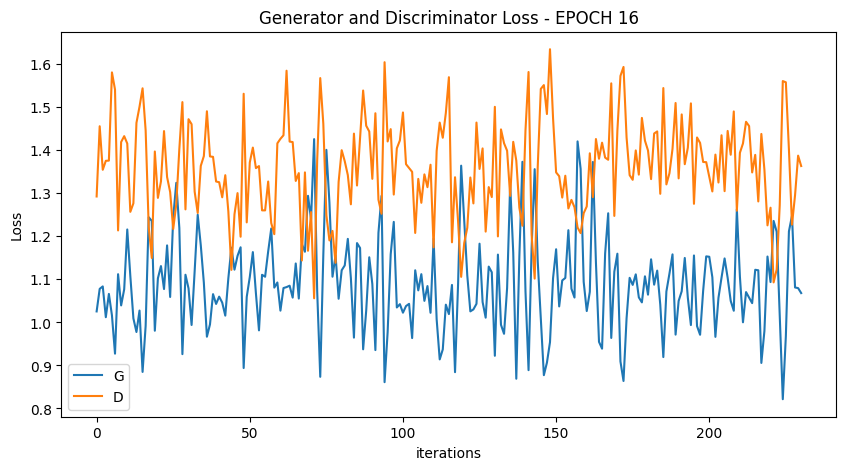

  0%|          | 0/231 [00:00<?, ?it/s]

[18/50][115/231] Loss_D: 1.4456 Loss_G: 0.9307 D(x): 0.4181 D(G(z)): 0.4246 / 0.3857
[18/50][230/231] Loss_D: 1.2688 Loss_G: 1.1336 D(x): 0.4879 D(G(z)): 0.3973 / 0.3107


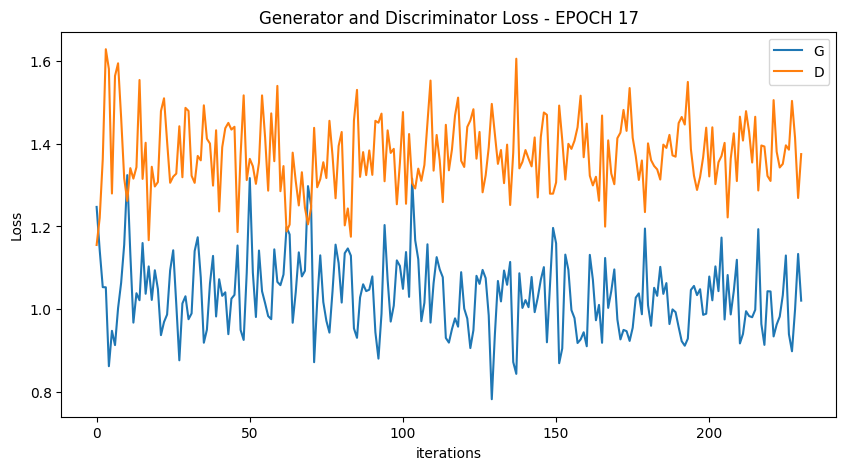

  0%|          | 0/231 [00:00<?, ?it/s]

[19/50][115/231] Loss_D: 1.3329 Loss_G: 0.9344 D(x): 0.4057 D(G(z)): 0.3437 / 0.3786
[19/50][230/231] Loss_D: 1.3116 Loss_G: 0.9426 D(x): 0.4949 D(G(z)): 0.4323 / 0.3797


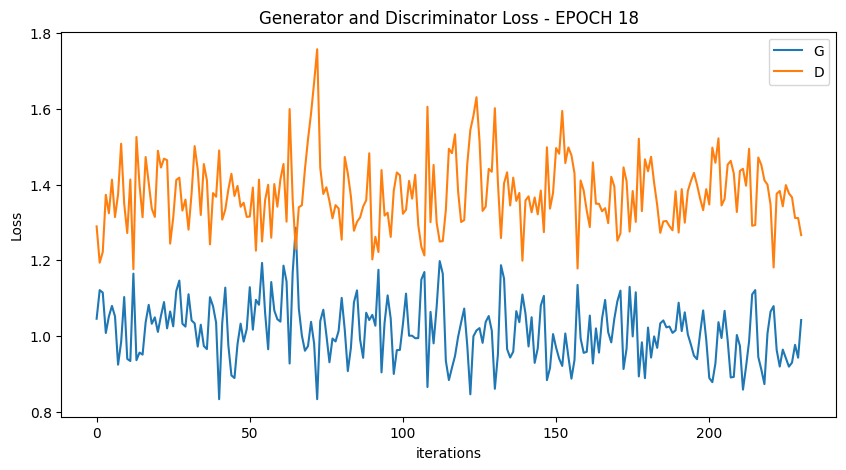

  0%|          | 0/231 [00:00<?, ?it/s]

[20/50][115/231] Loss_D: 1.4028 Loss_G: 0.9034 D(x): 0.4706 D(G(z)): 0.4610 / 0.4000
[20/50][230/231] Loss_D: 1.3495 Loss_G: 0.9767 D(x): 0.4368 D(G(z)): 0.4009 / 0.3640


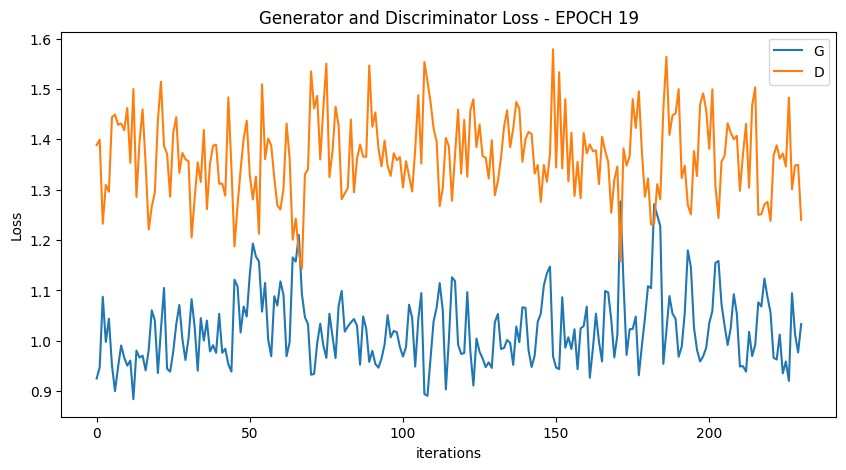

  0%|          | 0/231 [00:00<?, ?it/s]

[21/50][115/231] Loss_D: 1.4442 Loss_G: 0.8298 D(x): 0.4177 D(G(z)): 0.4298 / 0.4306
[21/50][230/231] Loss_D: 1.1577 Loss_G: 1.1845 D(x): 0.5354 D(G(z)): 0.3847 / 0.2898


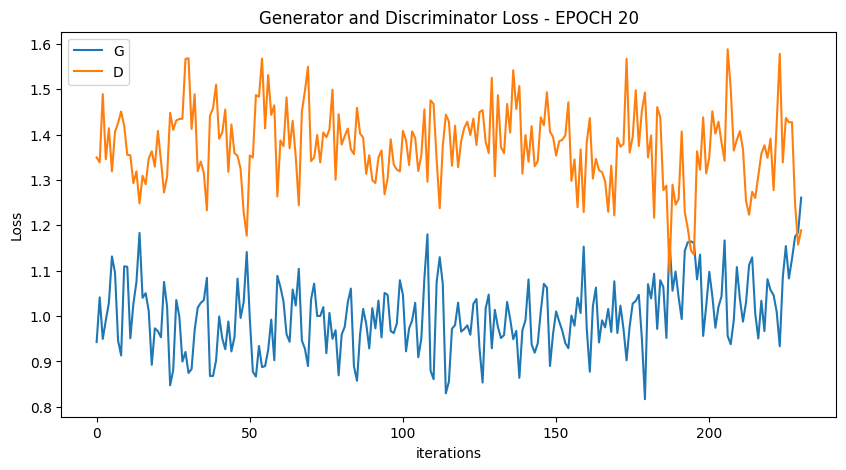

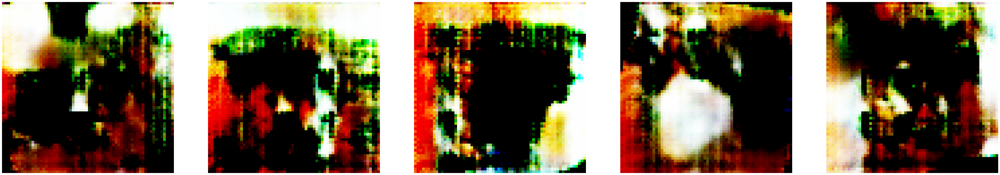

  0%|          | 0/231 [00:00<?, ?it/s]

[22/50][115/231] Loss_D: 1.3595 Loss_G: 1.1038 D(x): 0.4186 D(G(z)): 0.3805 / 0.3128
[22/50][230/231] Loss_D: 1.4855 Loss_G: 0.9134 D(x): 0.4401 D(G(z)): 0.4745 / 0.3971


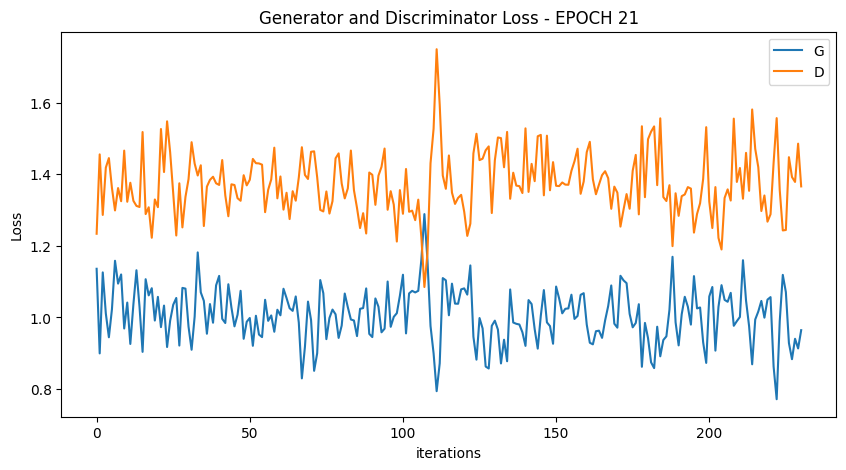

  0%|          | 0/231 [00:00<?, ?it/s]

[23/50][115/231] Loss_D: 1.2668 Loss_G: 1.1372 D(x): 0.4229 D(G(z)): 0.3279 / 0.3106
[23/50][230/231] Loss_D: 1.3302 Loss_G: 1.0873 D(x): 0.4826 D(G(z)): 0.4190 / 0.3278


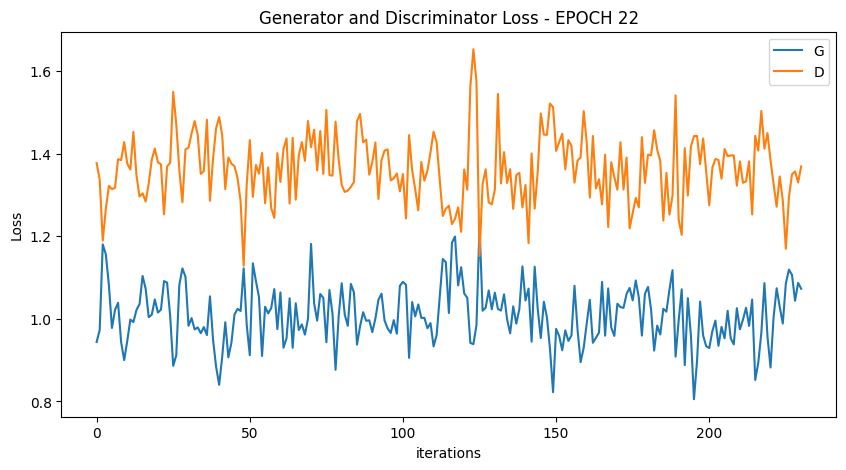

  0%|          | 0/231 [00:00<?, ?it/s]

[24/50][115/231] Loss_D: 1.2540 Loss_G: 1.0962 D(x): 0.5057 D(G(z)): 0.4121 / 0.3207
[24/50][230/231] Loss_D: 1.3649 Loss_G: 1.1104 D(x): 0.4698 D(G(z)): 0.4372 / 0.3163


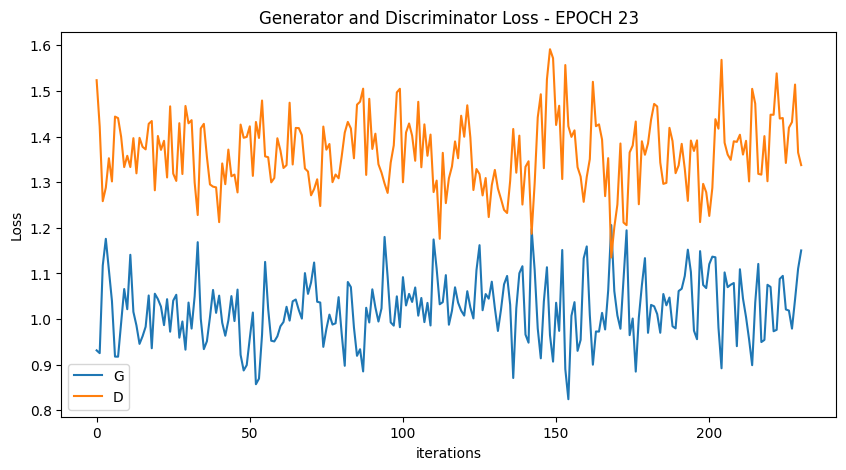

  0%|          | 0/231 [00:00<?, ?it/s]

[25/50][115/231] Loss_D: 1.2630 Loss_G: 1.0346 D(x): 0.4884 D(G(z)): 0.4057 / 0.3409
[25/50][230/231] Loss_D: 1.3932 Loss_G: 0.9694 D(x): 0.4258 D(G(z)): 0.4127 / 0.3678


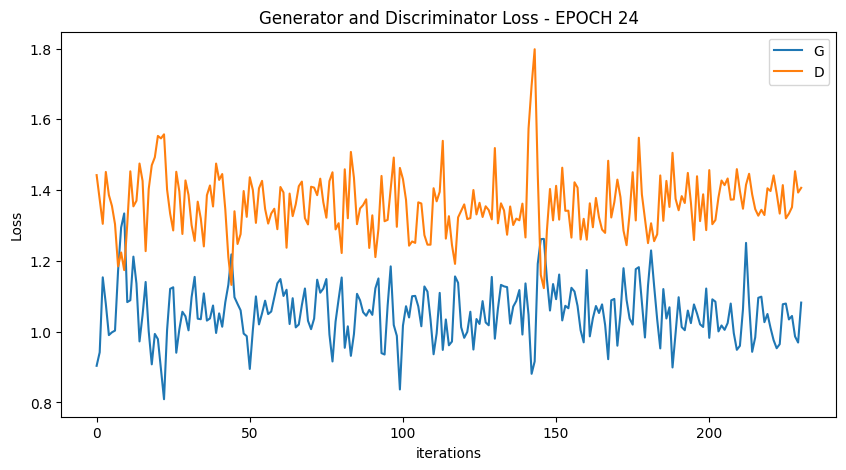

  0%|          | 0/231 [00:00<?, ?it/s]

[26/50][115/231] Loss_D: 1.4040 Loss_G: 0.9969 D(x): 0.4629 D(G(z)): 0.4534 / 0.3571
[26/50][230/231] Loss_D: 1.3846 Loss_G: 1.0472 D(x): 0.4737 D(G(z)): 0.4412 / 0.3416


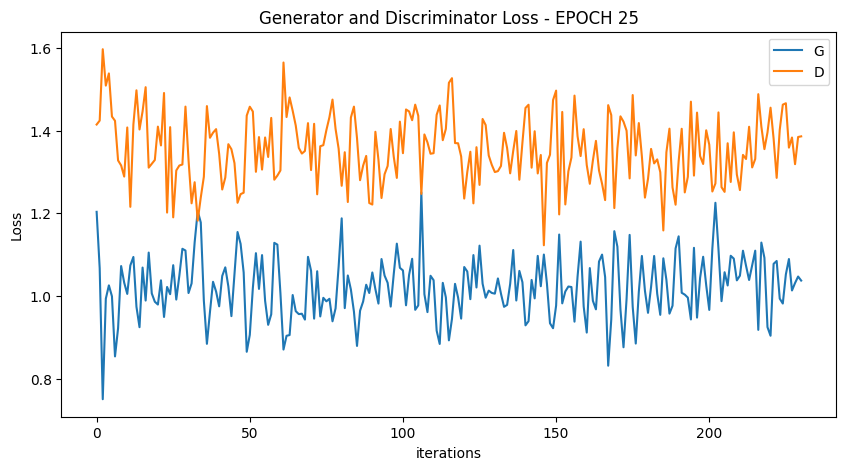

  0%|          | 0/231 [00:00<?, ?it/s]

[27/50][115/231] Loss_D: 1.2697 Loss_G: 1.0604 D(x): 0.5031 D(G(z)): 0.4177 / 0.3375
[27/50][230/231] Loss_D: 1.2518 Loss_G: 1.1082 D(x): 0.5401 D(G(z)): 0.4334 / 0.3182


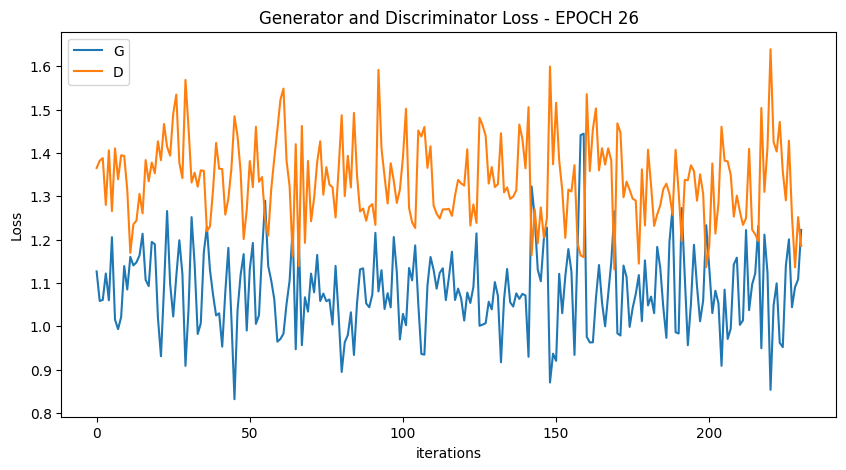

  0%|          | 0/231 [00:00<?, ?it/s]

[28/50][115/231] Loss_D: 1.2985 Loss_G: 1.1916 D(x): 0.4636 D(G(z)): 0.3870 / 0.2941
[28/50][230/231] Loss_D: 1.4327 Loss_G: 0.9564 D(x): 0.4456 D(G(z)): 0.4413 / 0.3716


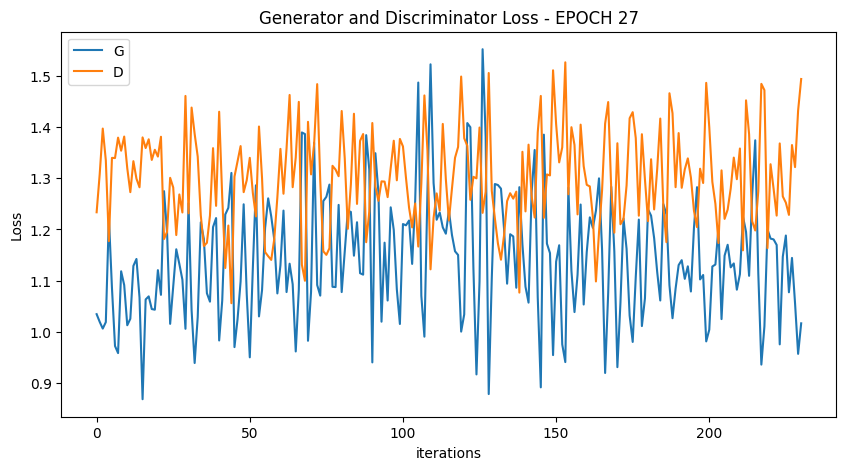

  0%|          | 0/231 [00:00<?, ?it/s]

[29/50][115/231] Loss_D: 1.1554 Loss_G: 1.3786 D(x): 0.5350 D(G(z)): 0.3784 / 0.2360
[29/50][230/231] Loss_D: 1.3904 Loss_G: 1.1947 D(x): 0.6483 D(G(z)): 0.5591 / 0.3015


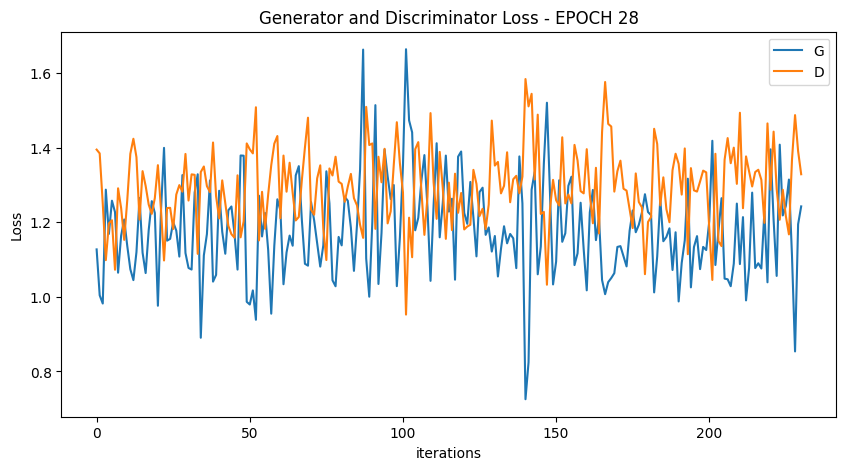

  0%|          | 0/231 [00:00<?, ?it/s]

[30/50][115/231] Loss_D: 1.2289 Loss_G: 1.3051 D(x): 0.5018 D(G(z)): 0.3775 / 0.2693
[30/50][230/231] Loss_D: 1.2884 Loss_G: 1.0565 D(x): 0.5041 D(G(z)): 0.4088 / 0.3422


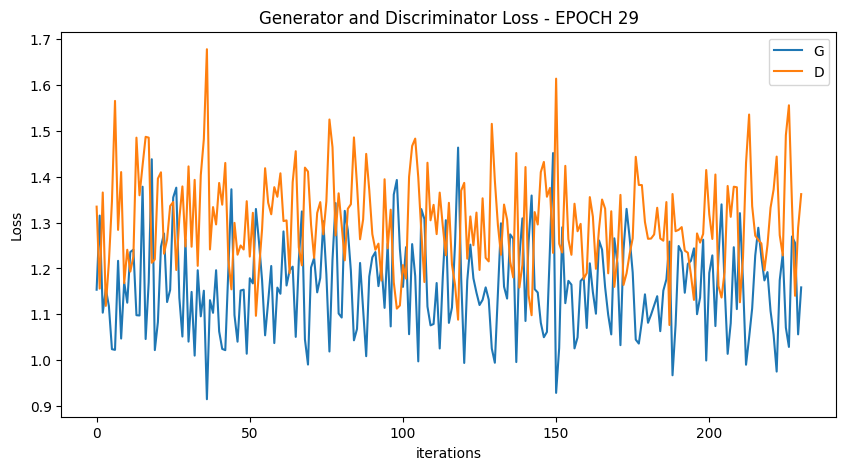

  0%|          | 0/231 [00:00<?, ?it/s]

[31/50][115/231] Loss_D: 1.3118 Loss_G: 1.1569 D(x): 0.4564 D(G(z)): 0.3613 / 0.3140
[31/50][230/231] Loss_D: 1.4451 Loss_G: 1.0550 D(x): 0.4590 D(G(z)): 0.4627 / 0.3492


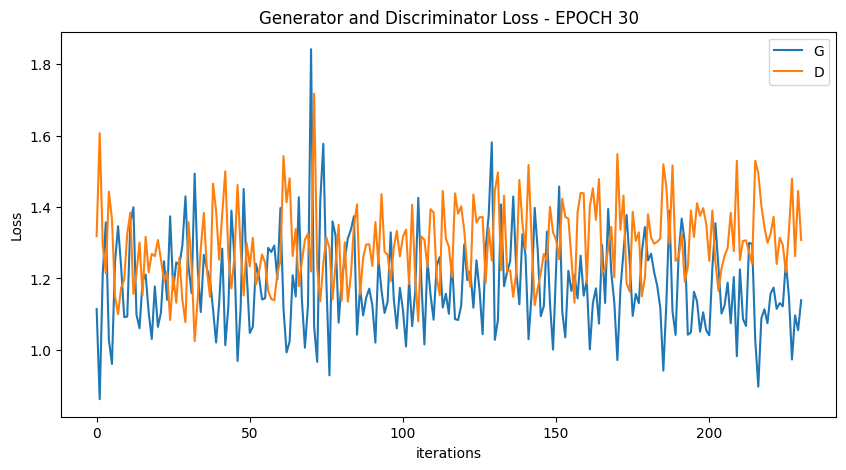

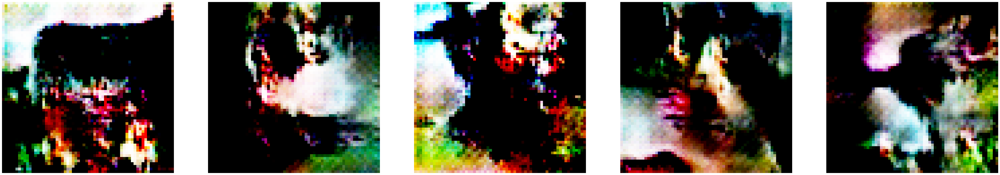

  0%|          | 0/231 [00:00<?, ?it/s]

[32/50][115/231] Loss_D: 1.3953 Loss_G: 1.1844 D(x): 0.5164 D(G(z)): 0.4947 / 0.2900
[32/50][230/231] Loss_D: 1.2999 Loss_G: 1.2303 D(x): 0.4337 D(G(z)): 0.3351 / 0.2813


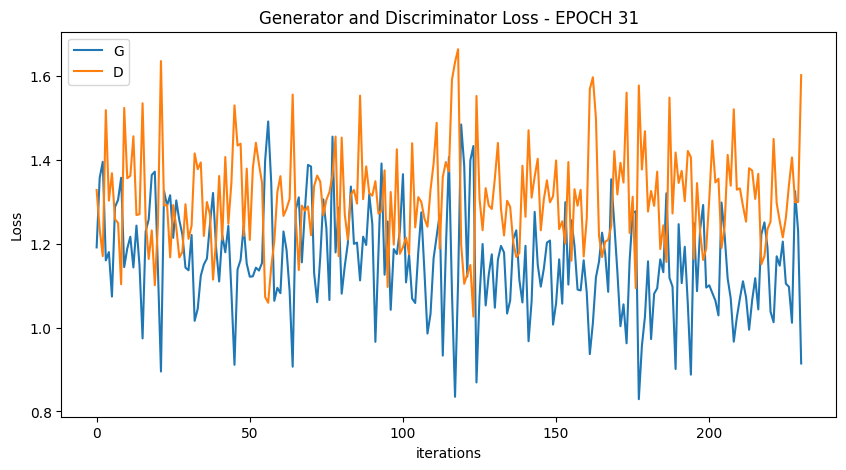

  0%|          | 0/231 [00:00<?, ?it/s]

[33/50][115/231] Loss_D: 1.3958 Loss_G: 1.0078 D(x): 0.4335 D(G(z)): 0.4113 / 0.3605
[33/50][230/231] Loss_D: 1.2190 Loss_G: 1.1164 D(x): 0.4917 D(G(z)): 0.3718 / 0.3153


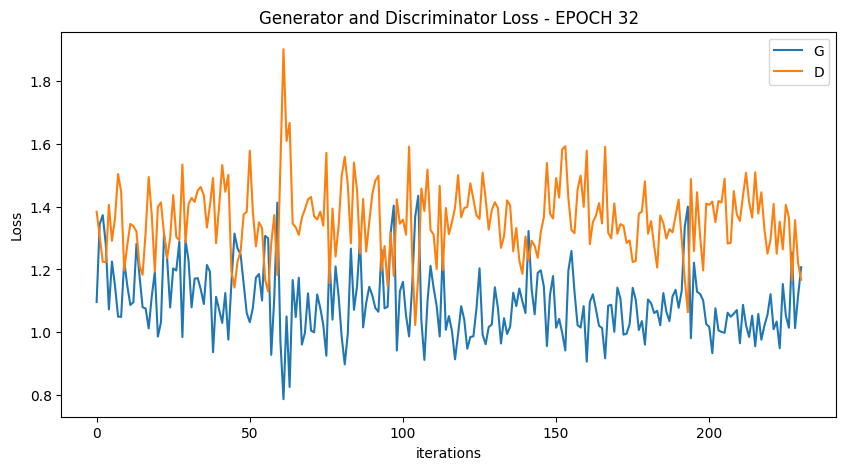

  0%|          | 0/231 [00:00<?, ?it/s]

[34/50][115/231] Loss_D: 1.3346 Loss_G: 1.1466 D(x): 0.4682 D(G(z)): 0.4100 / 0.2997
[34/50][230/231] Loss_D: 1.4263 Loss_G: 1.0249 D(x): 0.4617 D(G(z)): 0.4478 / 0.3667


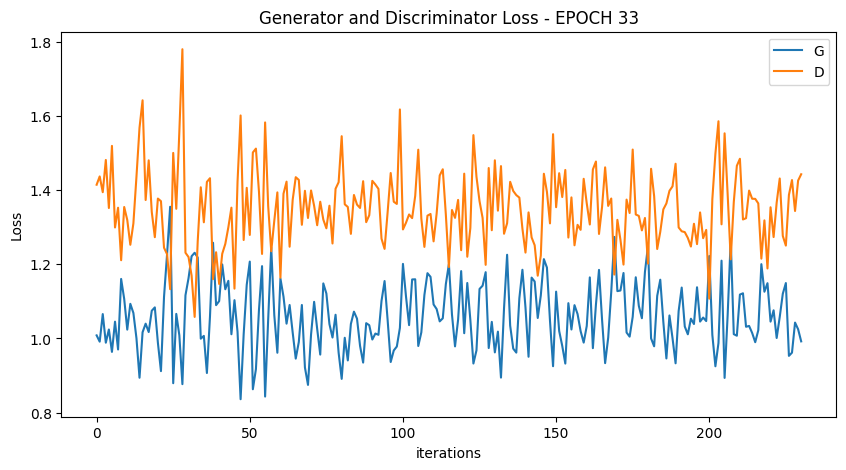

  0%|          | 0/231 [00:00<?, ?it/s]

[35/50][115/231] Loss_D: 1.3242 Loss_G: 1.0484 D(x): 0.4366 D(G(z)): 0.3884 / 0.3353
[35/50][230/231] Loss_D: 1.2306 Loss_G: 1.1013 D(x): 0.5248 D(G(z)): 0.4127 / 0.3155


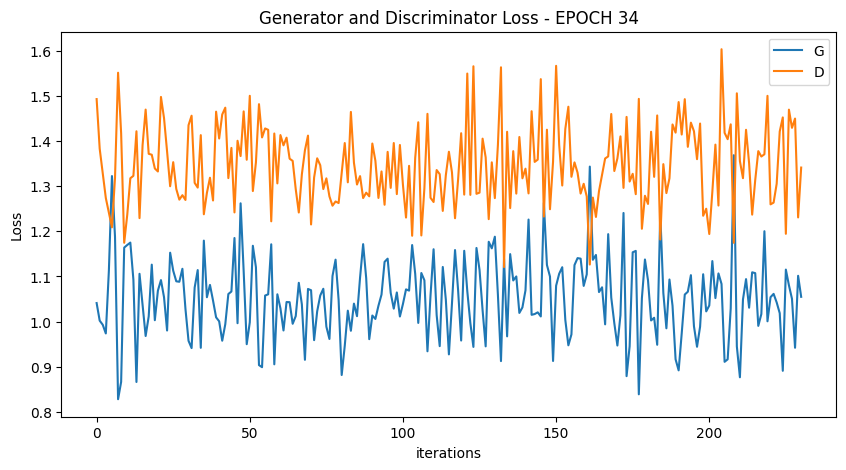

  0%|          | 0/231 [00:00<?, ?it/s]

[36/50][115/231] Loss_D: 1.3718 Loss_G: 1.0422 D(x): 0.4317 D(G(z)): 0.4001 / 0.3423
[36/50][230/231] Loss_D: 1.4282 Loss_G: 1.1072 D(x): 0.5074 D(G(z)): 0.4833 / 0.3230


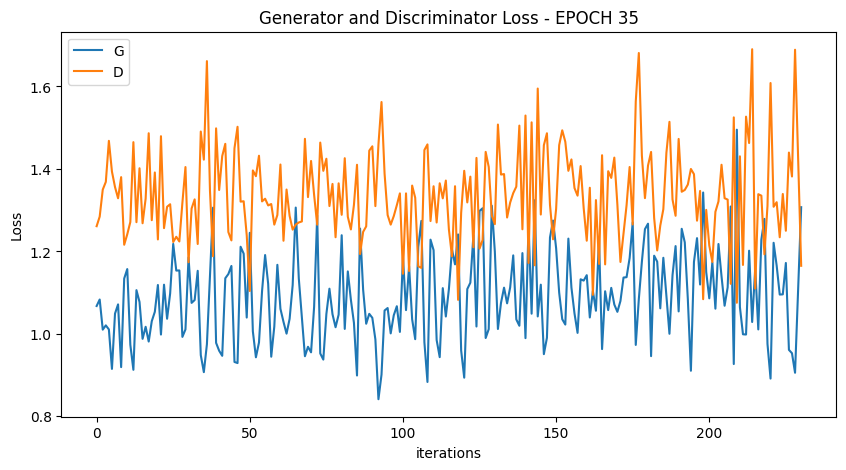

  0%|          | 0/231 [00:00<?, ?it/s]

[37/50][115/231] Loss_D: 1.2499 Loss_G: 1.1767 D(x): 0.4834 D(G(z)): 0.3848 / 0.2968
[37/50][230/231] Loss_D: 1.3605 Loss_G: 1.0251 D(x): 0.5275 D(G(z)): 0.4848 / 0.3470


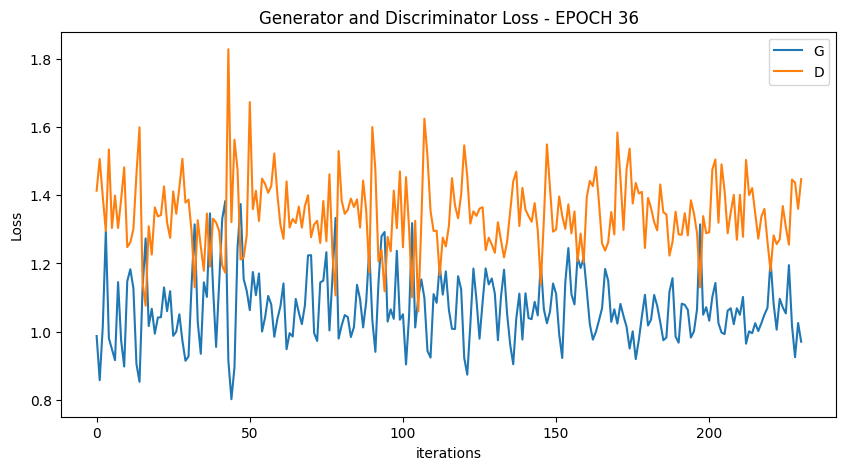

  0%|          | 0/231 [00:00<?, ?it/s]

[38/50][115/231] Loss_D: 1.4211 Loss_G: 1.0836 D(x): 0.4904 D(G(z)): 0.4722 / 0.3265
[38/50][230/231] Loss_D: 1.3948 Loss_G: 0.9513 D(x): 0.4722 D(G(z)): 0.4583 / 0.3733


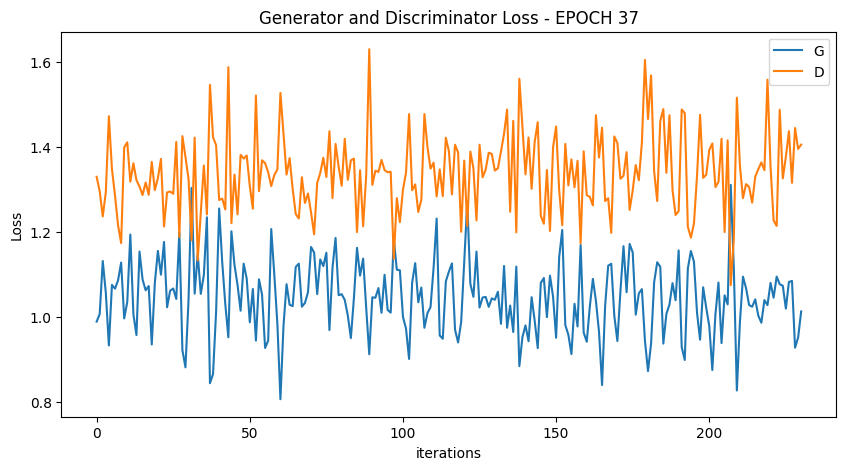

  0%|          | 0/231 [00:00<?, ?it/s]

[39/50][115/231] Loss_D: 1.3419 Loss_G: 0.9624 D(x): 0.4662 D(G(z)): 0.4218 / 0.3758
[39/50][230/231] Loss_D: 1.3078 Loss_G: 1.0329 D(x): 0.5139 D(G(z)): 0.4494 / 0.3395


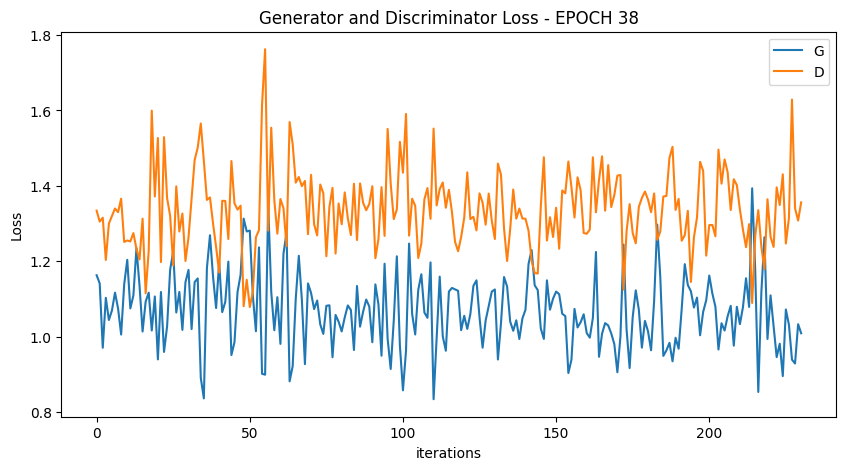

  0%|          | 0/231 [00:00<?, ?it/s]

[40/50][115/231] Loss_D: 1.3296 Loss_G: 0.9956 D(x): 0.4588 D(G(z)): 0.4122 / 0.3558
[40/50][230/231] Loss_D: 1.1960 Loss_G: 1.3735 D(x): 0.6175 D(G(z)): 0.4624 / 0.2370


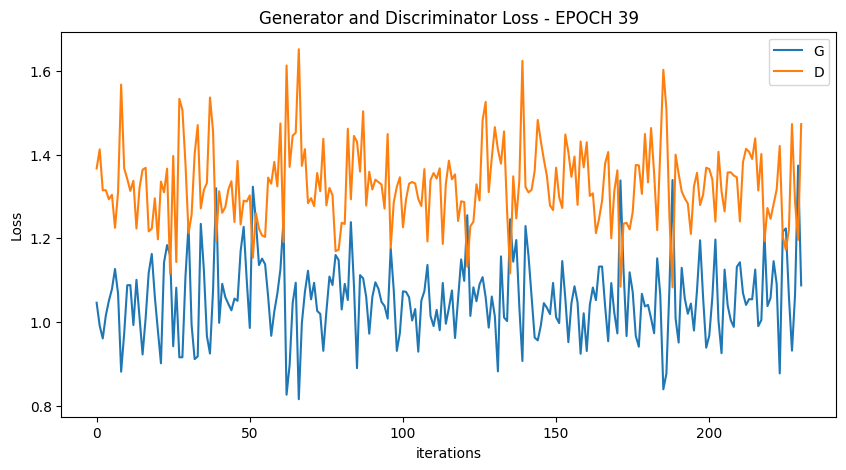

  0%|          | 0/231 [00:00<?, ?it/s]

[41/50][115/231] Loss_D: 1.2494 Loss_G: 1.0839 D(x): 0.4685 D(G(z)): 0.3729 / 0.3201
[41/50][230/231] Loss_D: 1.5206 Loss_G: 0.9283 D(x): 0.4217 D(G(z)): 0.4700 / 0.3851


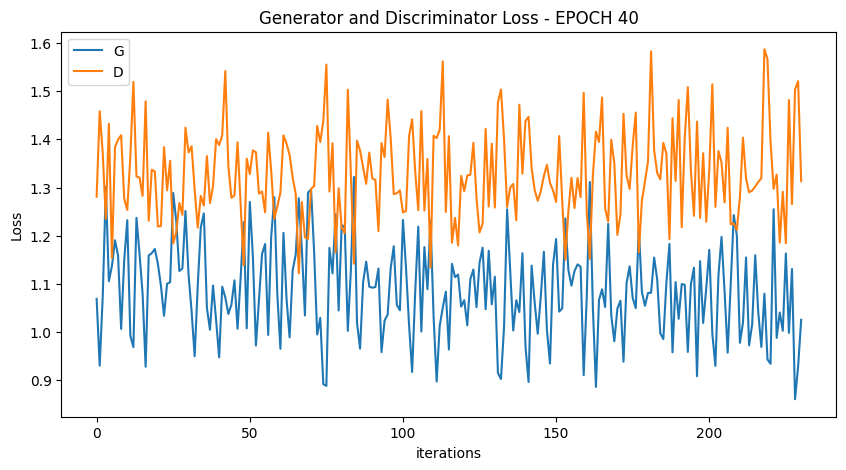

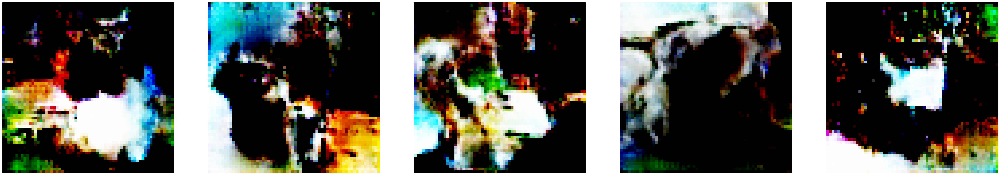

  0%|          | 0/231 [00:00<?, ?it/s]

[42/50][115/231] Loss_D: 1.1811 Loss_G: 1.1883 D(x): 0.5603 D(G(z)): 0.4136 / 0.2875
[42/50][230/231] Loss_D: 1.3483 Loss_G: 1.1777 D(x): 0.4592 D(G(z)): 0.4155 / 0.2972


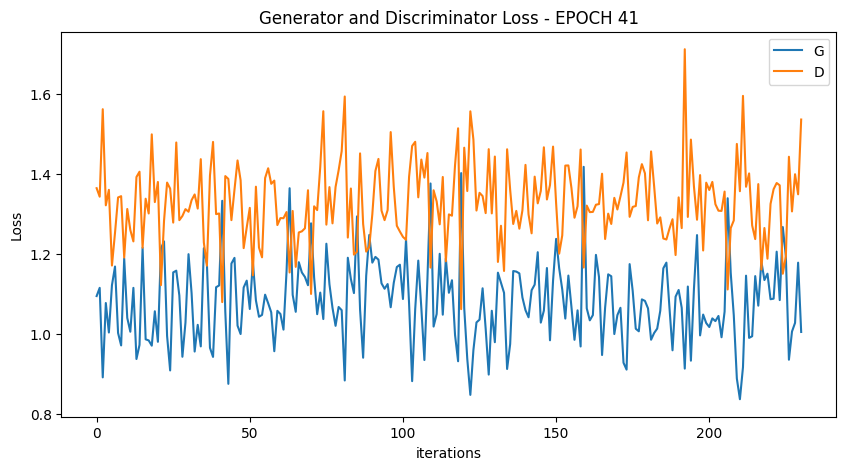

  0%|          | 0/231 [00:00<?, ?it/s]

[43/50][115/231] Loss_D: 1.4652 Loss_G: 0.9232 D(x): 0.4264 D(G(z)): 0.4395 / 0.3911
[43/50][230/231] Loss_D: 1.2803 Loss_G: 1.1171 D(x): 0.5889 D(G(z)): 0.4866 / 0.3142


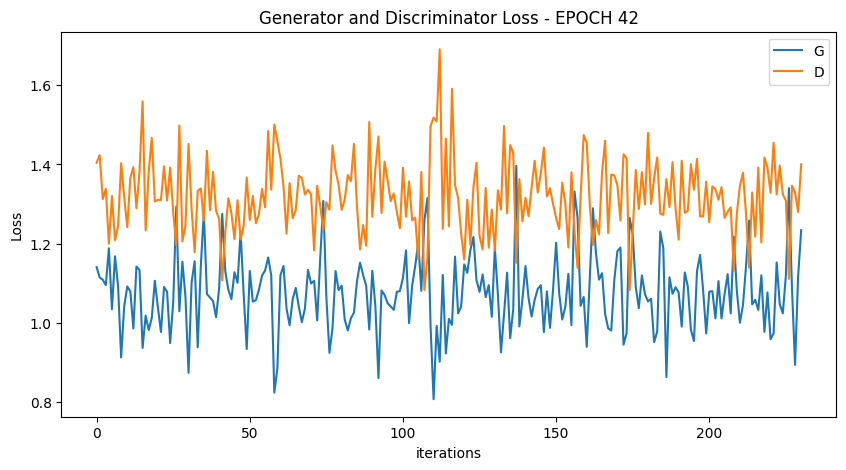

  0%|          | 0/231 [00:00<?, ?it/s]

[44/50][115/231] Loss_D: 1.1589 Loss_G: 1.1937 D(x): 0.5030 D(G(z)): 0.3489 / 0.2828
[44/50][230/231] Loss_D: 1.2489 Loss_G: 1.0946 D(x): 0.4573 D(G(z)): 0.3469 / 0.3332


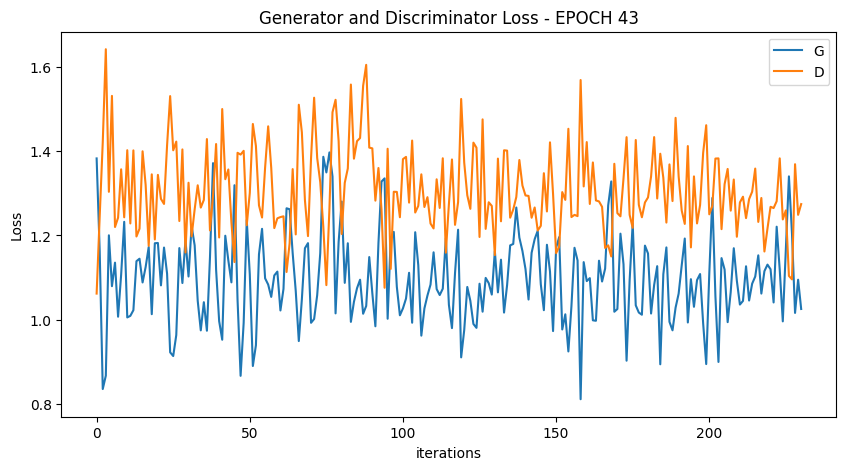

  0%|          | 0/231 [00:00<?, ?it/s]

[45/50][115/231] Loss_D: 1.3998 Loss_G: 1.0129 D(x): 0.3596 D(G(z)): 0.3102 / 0.3644
[45/50][230/231] Loss_D: 1.2760 Loss_G: 1.1020 D(x): 0.5441 D(G(z)): 0.4547 / 0.3260


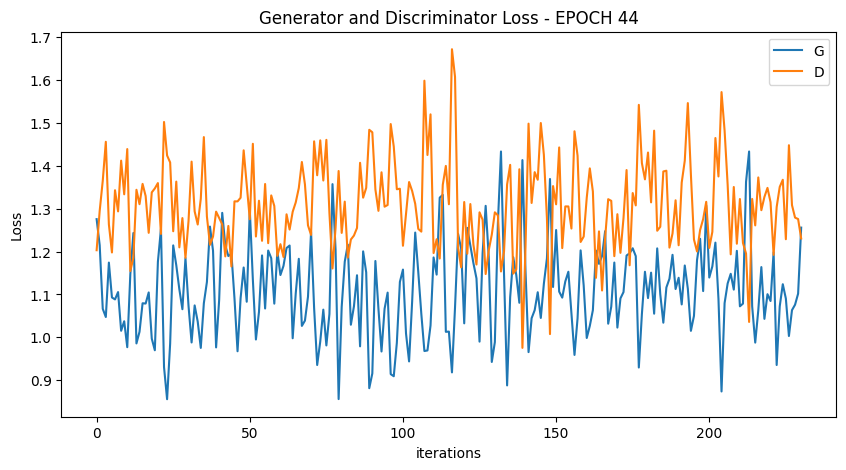

  0%|          | 0/231 [00:00<?, ?it/s]

[46/50][115/231] Loss_D: 1.3038 Loss_G: 1.1739 D(x): 0.4906 D(G(z)): 0.4196 / 0.2955
[46/50][230/231] Loss_D: 1.2209 Loss_G: 1.0998 D(x): 0.5013 D(G(z)): 0.3891 / 0.3178


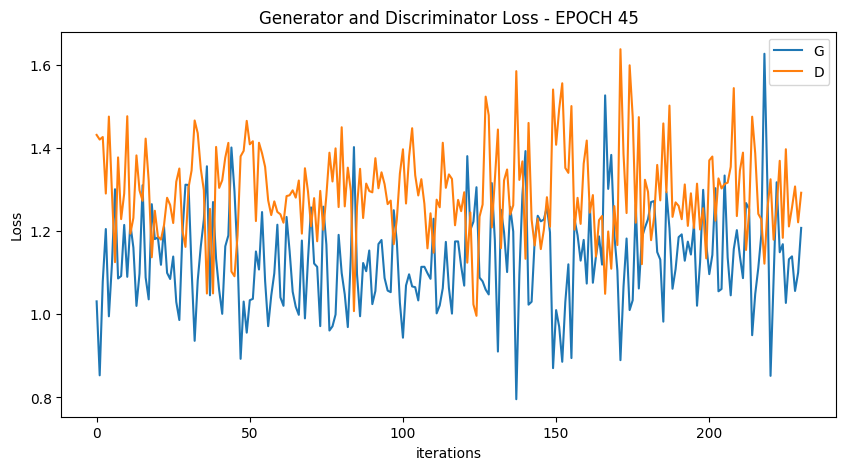

  0%|          | 0/231 [00:00<?, ?it/s]

[47/50][115/231] Loss_D: 1.1800 Loss_G: 1.1230 D(x): 0.5223 D(G(z)): 0.3702 / 0.3161
[47/50][230/231] Loss_D: 1.1610 Loss_G: 1.3184 D(x): 0.4825 D(G(z)): 0.3042 / 0.2573


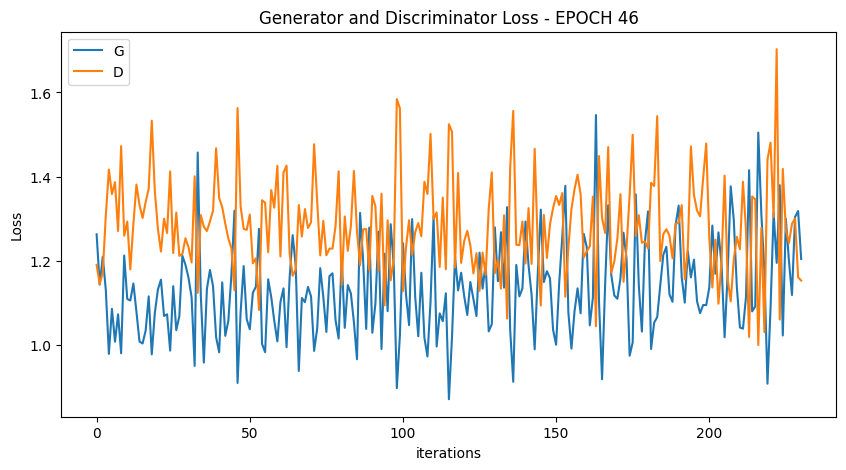

  0%|          | 0/231 [00:00<?, ?it/s]

[48/50][115/231] Loss_D: 1.3081 Loss_G: 1.1232 D(x): 0.4706 D(G(z)): 0.3857 / 0.3143
[48/50][230/231] Loss_D: 1.2694 Loss_G: 1.4452 D(x): 0.5662 D(G(z)): 0.4480 / 0.2283


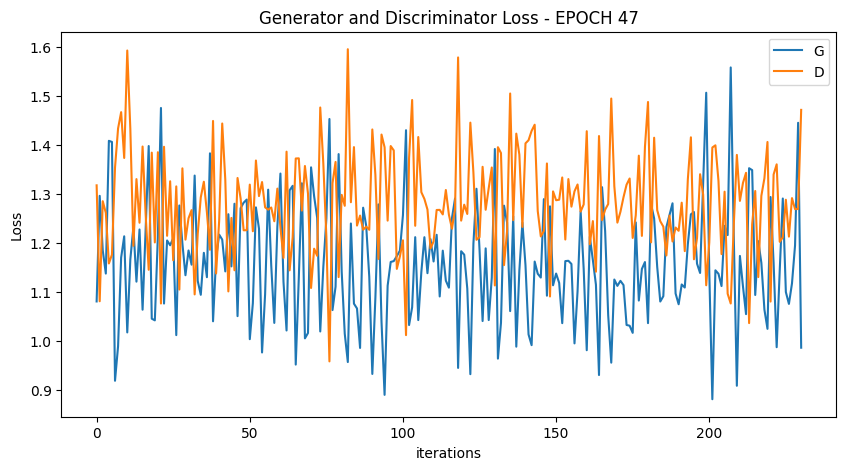

  0%|          | 0/231 [00:00<?, ?it/s]

[49/50][115/231] Loss_D: 1.2908 Loss_G: 1.0916 D(x): 0.4994 D(G(z)): 0.4097 / 0.3282
[49/50][230/231] Loss_D: 1.1250 Loss_G: 1.3189 D(x): 0.5876 D(G(z)): 0.3995 / 0.2490


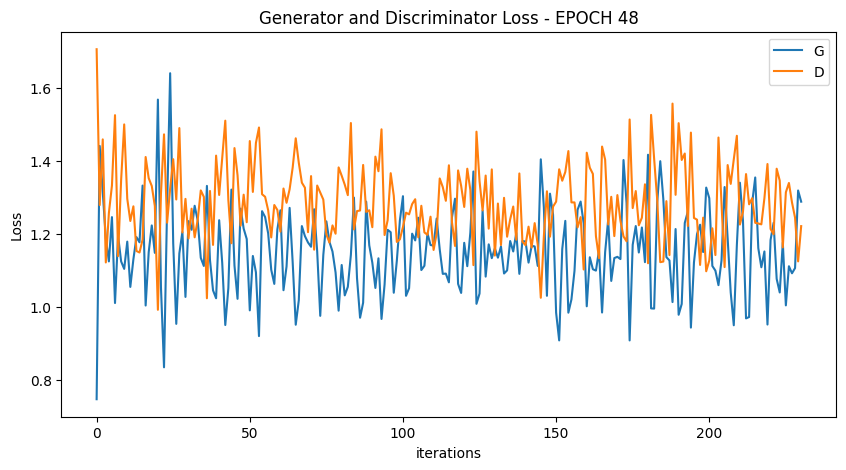

  0%|          | 0/231 [00:00<?, ?it/s]

[50/50][115/231] Loss_D: 1.3773 Loss_G: 1.0930 D(x): 0.4122 D(G(z)): 0.3568 / 0.3345
[50/50][230/231] Loss_D: 1.2189 Loss_G: 1.2888 D(x): 0.5495 D(G(z)): 0.4089 / 0.2647


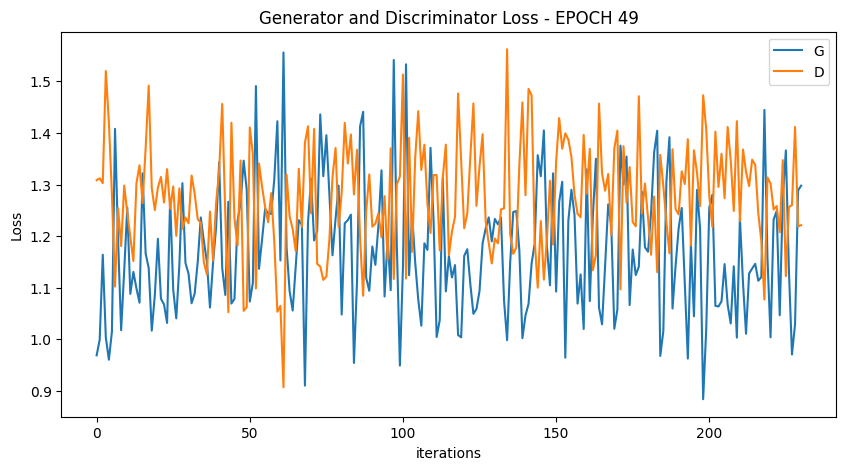

In [20]:
for epoch in range(epochs):
    
    start = time.time()
    for ii, (real_images, train_labels) in tqdm(enumerate(train_loader), total=len(train_loader)):
        # (1) Update D network: maximize log(D(x)) + log(1 - D(G(z)))
        # train with real
        netD.zero_grad()
        real_images = real_images.to(device)
        batch_size = real_images.size(0)
        labels = torch.full((batch_size, 1), real_label, device=device)

        output = netD(real_images)
        errD_real = criterion(output, labels)
        errD_real.backward()
        D_x = output.mean().item()

        # train with fake
        noise = torch.randn(batch_size, nz, 1, 1, device=device)
        fake = netG(noise)
        labels.fill_(fake_label)
        output = netD(fake.detach())
        errD_fake = criterion(output, labels)
        errD_fake.backward()
        D_G_z1 = output.mean().item()
        errD = errD_real + errD_fake
        optimizerD.step()

        # (2) Update G network: maximize log(D(G(z)))
        netG.zero_grad()
        labels.fill_(real_label)  
        output = netD(fake)
        errG = criterion(output, labels)
        errG.backward()
        D_G_z2 = output.mean().item()
        optimizerG.step()
        
        # Save Losses for plotting later
        G_losses.append(errG.item())
        D_losses.append(errD.item())
        
        if (ii+1) % (len(train_loader)//2) == 0:
            print('[%d/%d][%d/%d] Loss_D: %.4f Loss_G: %.4f D(x): %.4f D(G(z)): %.4f / %.4f'
                  % (epoch + 1, epochs, ii+1, len(train_loader),
                     errD.item(), errG.item(), D_x, D_G_z1, D_G_z2))
            
    plot_loss (G_losses, D_losses, epoch)
    G_losses = []
    D_losses = []
    if epoch % 10 == 0:
        show_generated_img()

    epoch_time.append(time.time()- start)

In [21]:
print (">> average EPOCH duration = ", np.mean(epoch_time))

>> average EPOCH duration =  77.23563480854034


# Вывод сгенерированных изображений

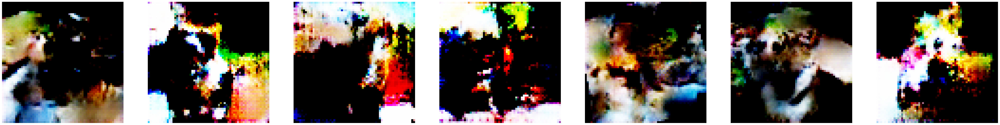

In [23]:
show_generated_img(7)

In [24]:
if not os.path.exists('../output_images'):
    os.mkdir('../output_images')
    
im_batch_size = 50
n_images=10000

for i_batch in tqdm(range(0, n_images, im_batch_size)):
    gen_z = torch.randn(im_batch_size, nz, 1, 1, device=device)
    gen_images = netG(gen_z)
    images = gen_images.to("cpu").clone().detach()
    images = images.numpy().transpose(0, 2, 3, 1)
    for i_image in range(gen_images.size(0)):
        save_image(gen_images[i_image, :, :, :], os.path.join('../output_images', f'image_{i_batch+i_image:05d}.png'))

<ipython-input-24-55c27581f9dc>:7: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  for i_batch in tqdm(range(0, n_images, im_batch_size)):


  0%|          | 0/200 [00:00<?, ?it/s]

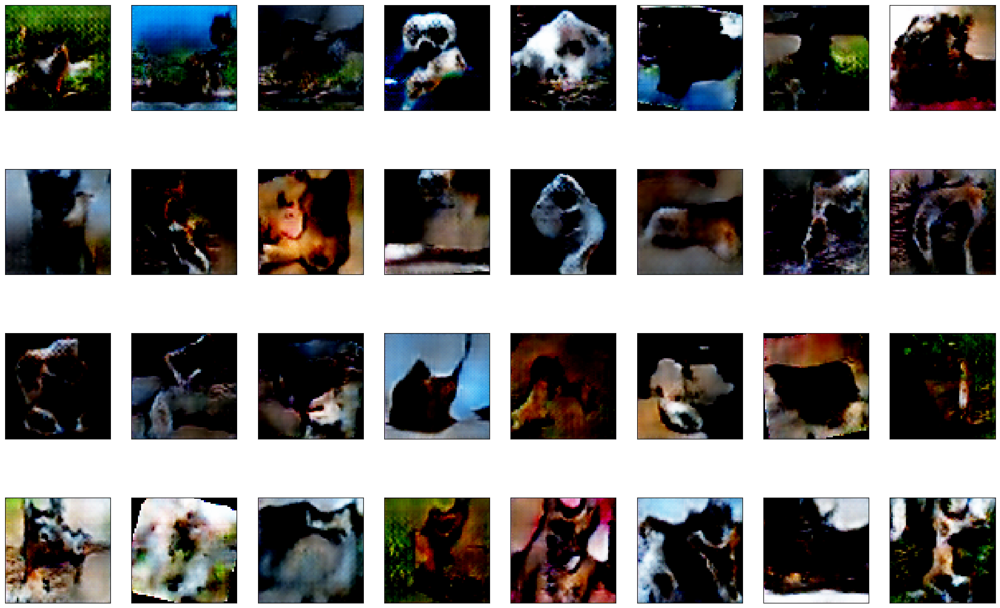

In [25]:
fig = plt.figure(figsize=(25, 16))
# display 10 images from each class
for i, j in enumerate(images[:32]):
    ax = fig.add_subplot(4, 8, i + 1, xticks=[], yticks=[])
    plt.imshow(j)

### Архив сгенерированных картинок

In [26]:
import shutil
shutil.make_archive('images', 'zip', '../output_images')

'/content/images.zip'